<a href="https://colab.research.google.com/github/Mayar215999/data-science-project/blob/main/K_Means_Clustering_unsupervised_ML.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
# Force no warnings:
def warn(*args, **kwargs):
    pass
import warnings
warnings.warn = warn
warnings.filterwarnings('ignore')

# Setup and imports
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.preprocessing import scale
from sklearn.cluster import KMeans
from sklearn.datasets import make_blobs
from sklearn.utils import shuffle

# Sets backend to render higher res images
%config InlineBackend.figure_formats = ['retina']

In [2]:
plt.rcParams['figure.figsize'] = [6,6]
sns.set_style("whitegrid")
sns.set_context("talk")

K-means clustering is one of the most simple clustering algorithms. One of the limitations is that it depends on the starting point of the clusters, and the number of clusters need to be defined beforehand.








Cluster starting points
Let's start by creating a simple dataset.

In [3]:
# helper function that allows us to display data in 2 dimensions an highlights the clusters
def display_cluster(X,km=[],num_clusters=0):
    color = 'brgcmyk'
    alpha = 0.5
    s = 20
    if num_clusters == 0:
        plt.scatter(X[:,0],X[:,1],c = color[0],alpha = alpha,s = s)
    else:
        for i in range(num_clusters):
            plt.scatter(X[km.labels_==i,0],X[km.labels_==i,1],c = color[i],alpha = alpha,s=s)
            plt.scatter(km.cluster_centers_[i][0],km.cluster_centers_[i][1],c = color[i], marker = 'x', s = 100)

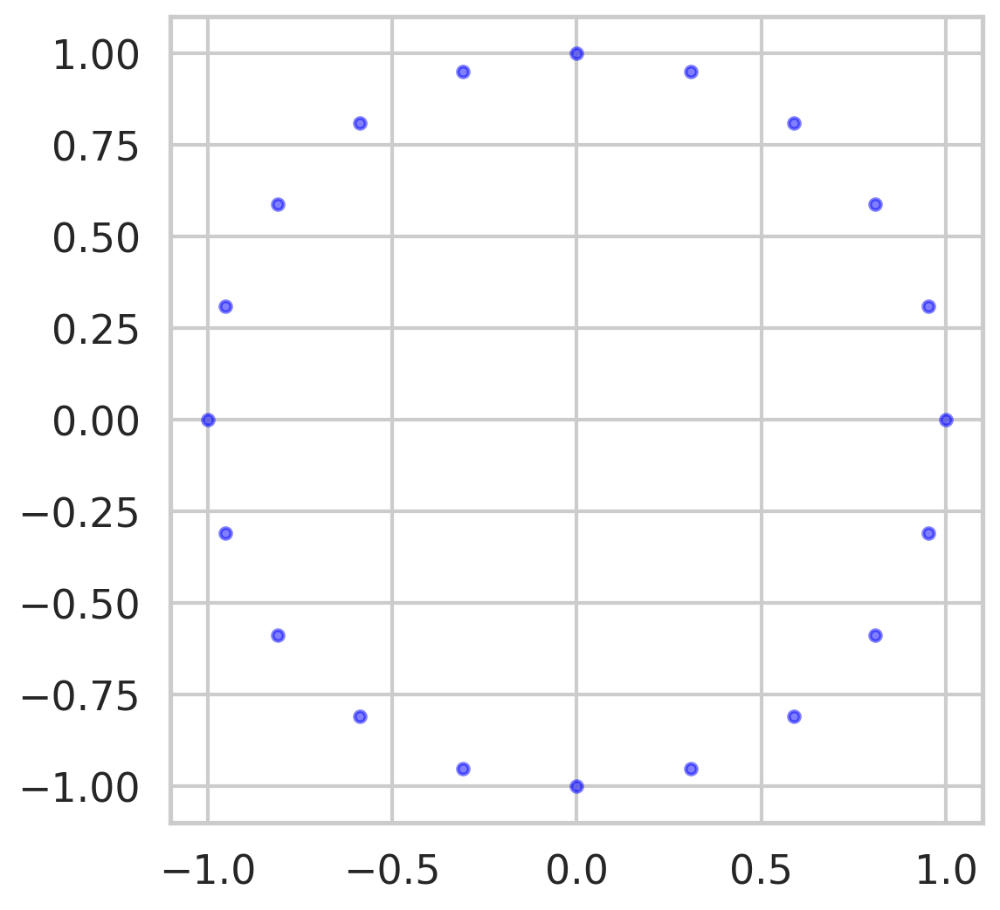

In [4]:
angle = np.linspace(0,2*np.pi,20, endpoint = False)
X = np.append([np.cos(angle)],[np.sin(angle)],0).transpose()
display_cluster(X)

Let's now group this data into two clusters. We will use two different random states to initialize the algorithm. Settign a the random state variable is useful for testing and allows us to seed the randomness (so we get the same results each time).

Clustering with a random state of 10:

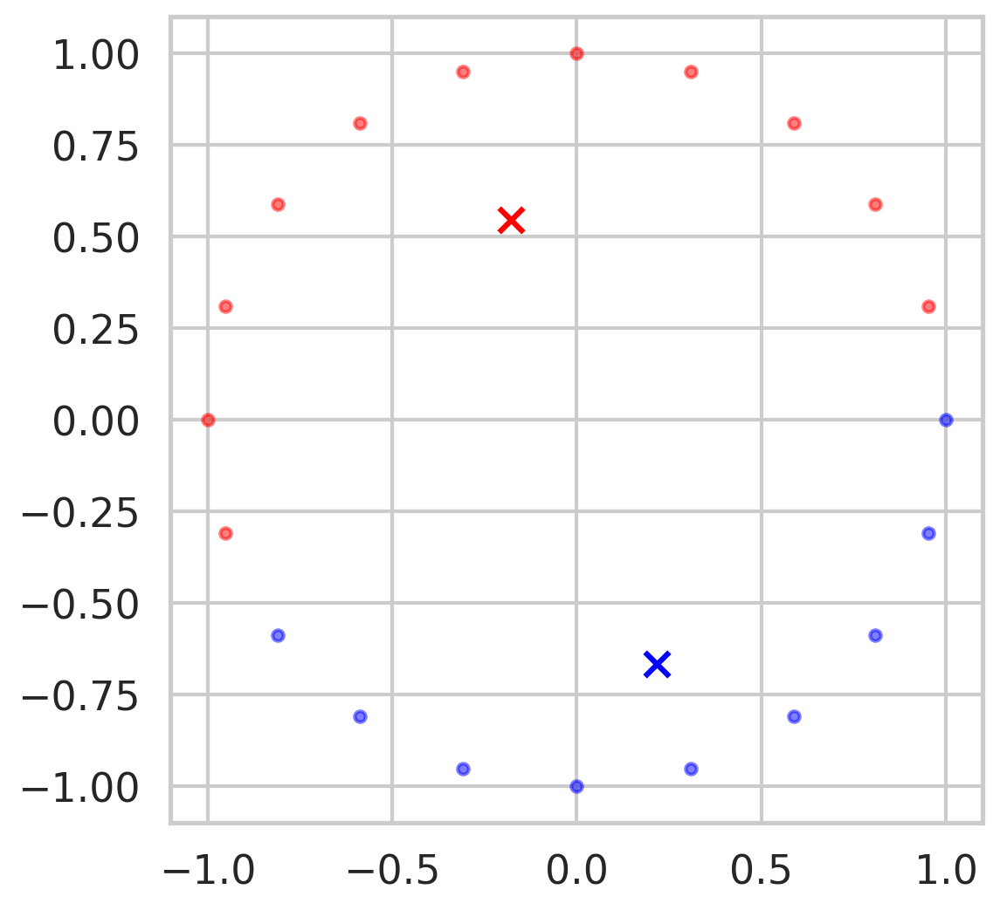

In [5]:
num_clusters = 2
km = KMeans(n_clusters=num_clusters,random_state=10,n_init=1) # n_init, number of times the K-mean algorithm will run
km.fit(X)
display_cluster(X,km,num_clusters)

Clustering with a random state of 20:

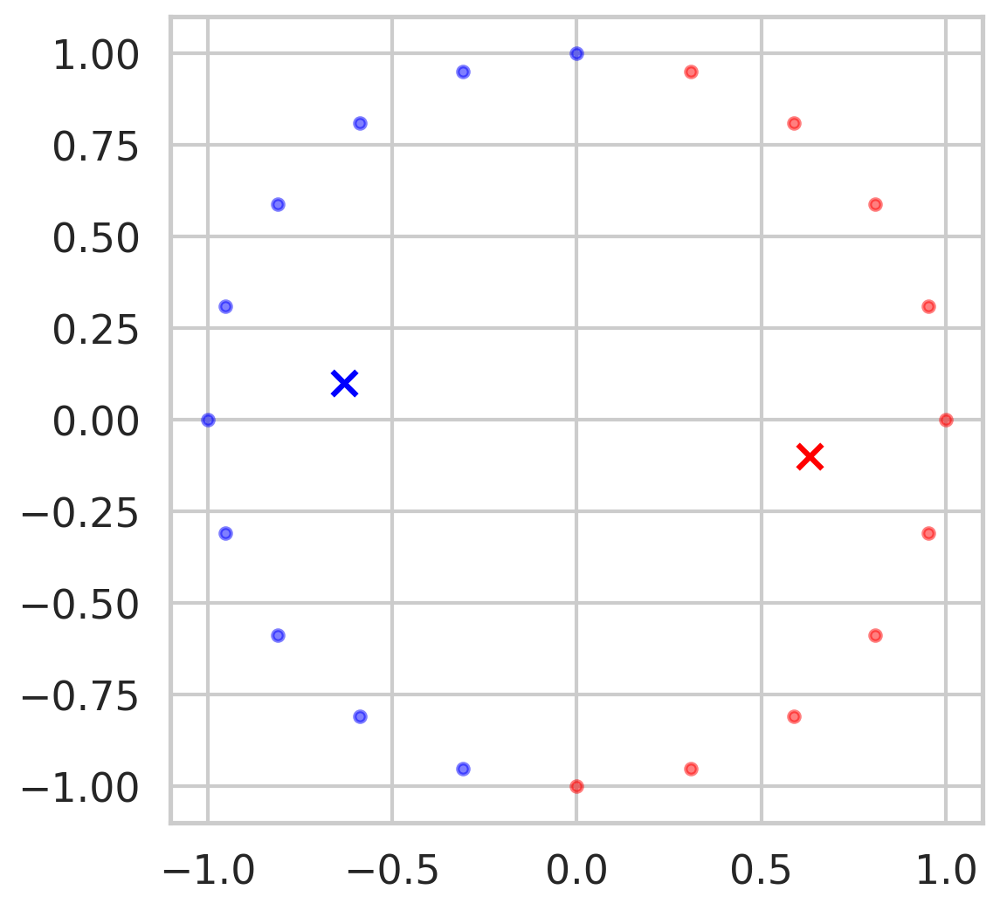

In [6]:
km = KMeans(n_clusters=num_clusters,random_state=20,n_init=1)
km.fit(X)
display_cluster(X,km,num_clusters)

Question:
Why are the clusters different when we run the K-means twice?

It's because the starting points of the cluster centers have an impact on where the final clusters lie. The starting point of the clusters is controlled by the random state.








Determining optimium number of clusters
Let's create a new dataset that visually consists on a few clusters and try to group them.

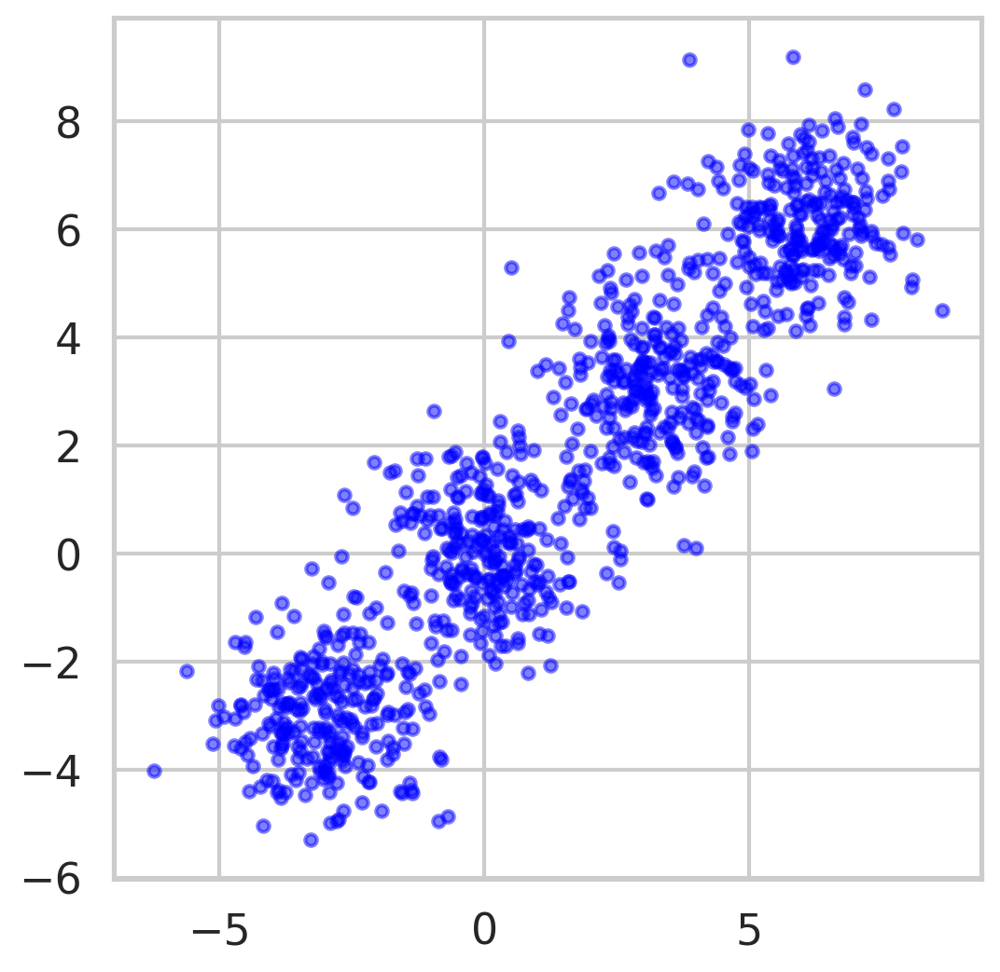

In [7]:
n_samples = 1000
n_bins = 4
centers = [(-3, -3), (0, 0), (3, 3), (6, 6)]
X, y = make_blobs(n_samples=n_samples, n_features=2, cluster_std=1.0,
                  centers=centers, shuffle=False, random_state=42)
display_cluster(X)

How many clusters do you observe?







Let's run K-means with seven clusters.

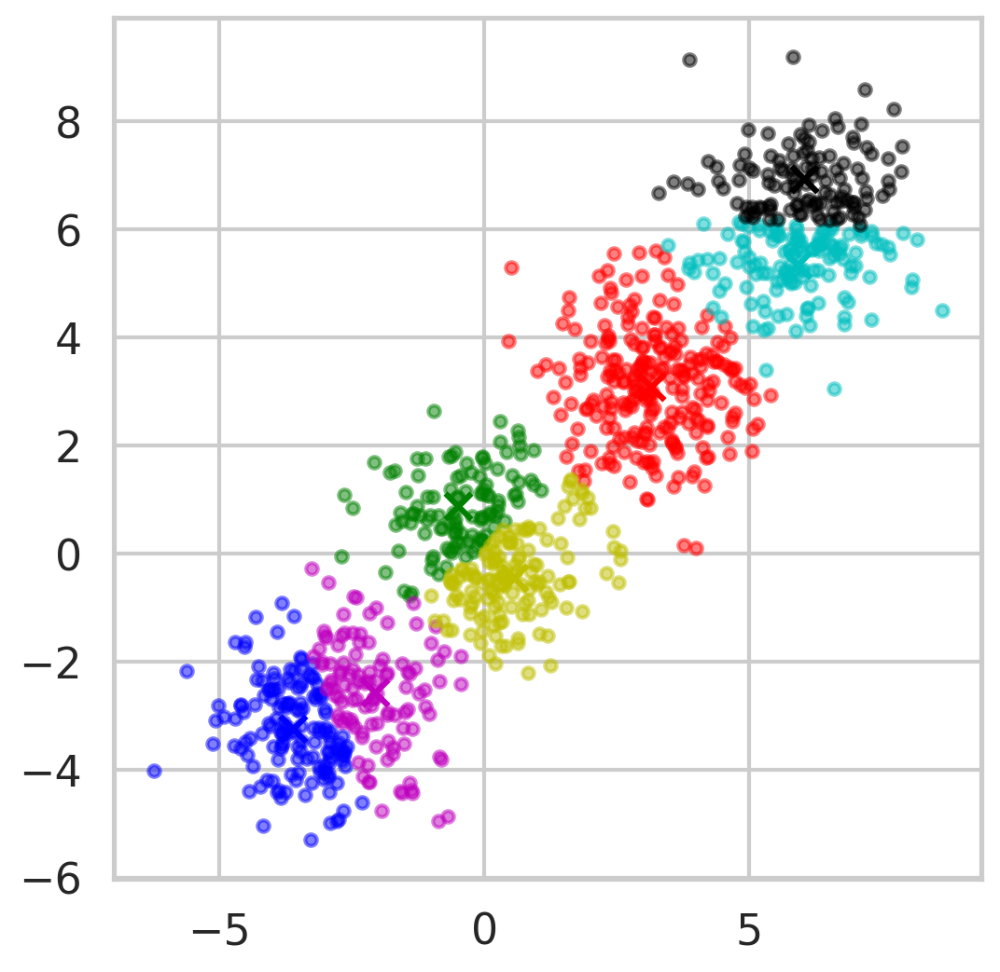

In [8]:
num_clusters = 7
km = KMeans(n_clusters=num_clusters)
km.fit(X)
display_cluster(X,km,num_clusters)

display_cluster(X,km,num_clusters)






Now let's re-run the algorithm with four clusters.

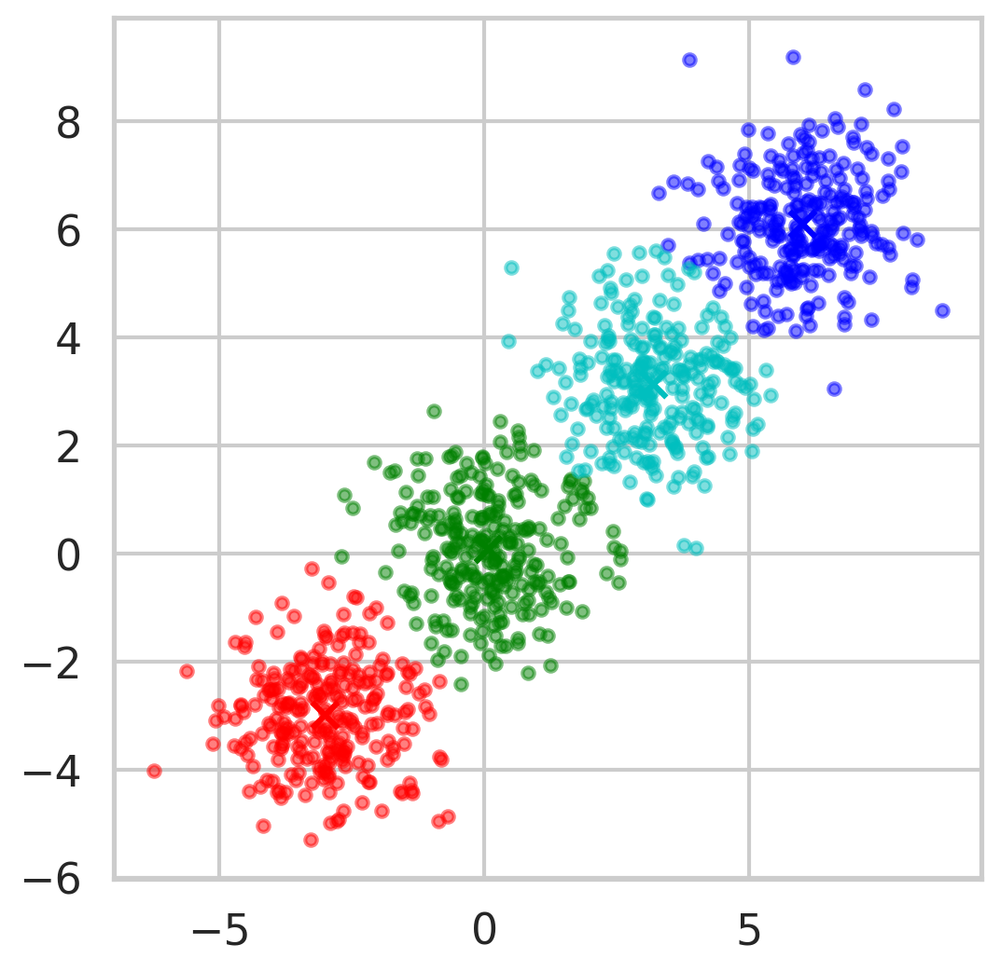

In [9]:
num_clusters = 4
km = KMeans(n_clusters=num_clusters)
km.fit(X)
display_cluster(X,km,num_clusters)

Should we use four or seven clusters?







In this case it may be visually obvious that four clusters is better than seven.
This is because we can easily view the data in two dimensional space.
However, real world data usually has more than two dimensions.
A dataset with a higher dimensional space is hard to visualize.
A way of solving this is to plot the inertia
inertia: (sum of squared error between each point and its cluster center) as a function of the number of clusters.

In [10]:
km.inertia_

1880.2259336026723

Problem 1:
Write code that calculates the inertia for 1 to 10 clusters, and plot the inertia as a function of the number of clusters.

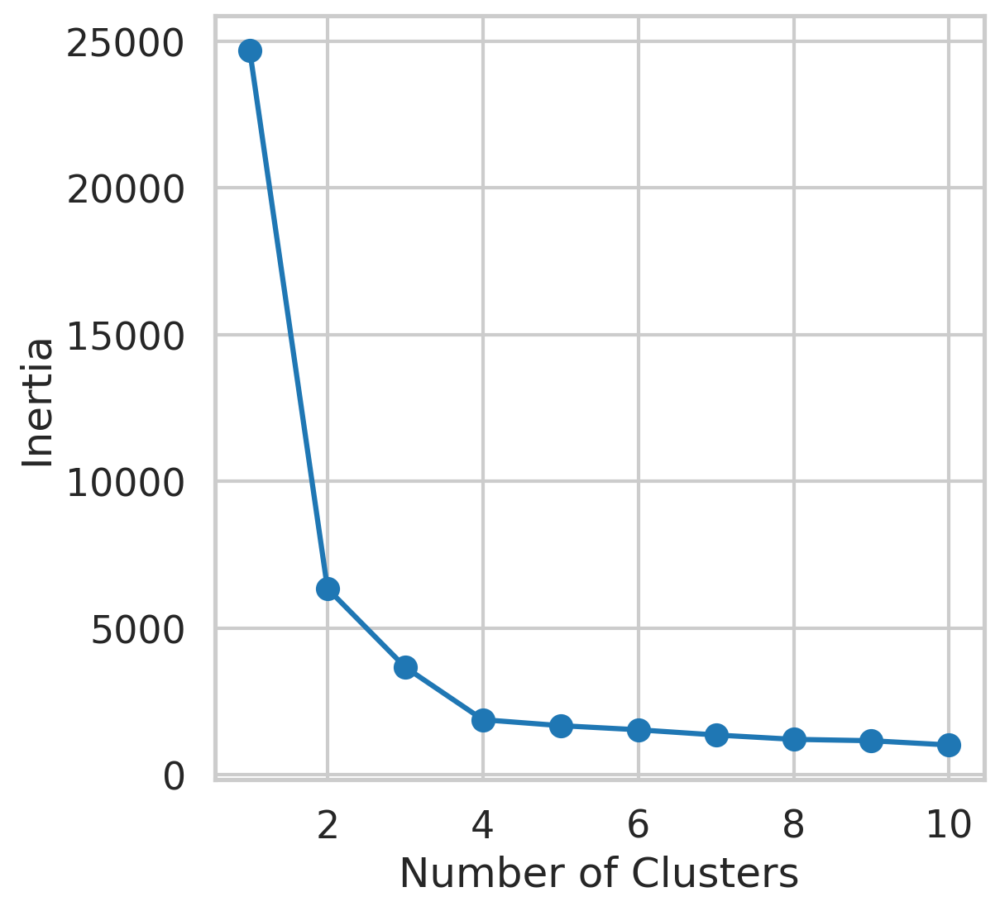

In [11]:
### BEGIN SOLUTION
inertia = []
list_num_clusters = list(range(1,11))
for num_clusters in list_num_clusters:
    km = KMeans(n_clusters=num_clusters)
    km.fit(X)
    inertia.append(km.inertia_)

plt.plot(list_num_clusters,inertia)
plt.scatter(list_num_clusters,inertia)
plt.xlabel('Number of Clusters')
plt.ylabel('Inertia');
### END SOLUTION

Where does the elbow of the curve occur?

What do you think the inertia would be if you have the same number of clusters and data points?

Clustering Colors from an Image






The next few exercises use an image of bell peppers. Let's start by loading it:

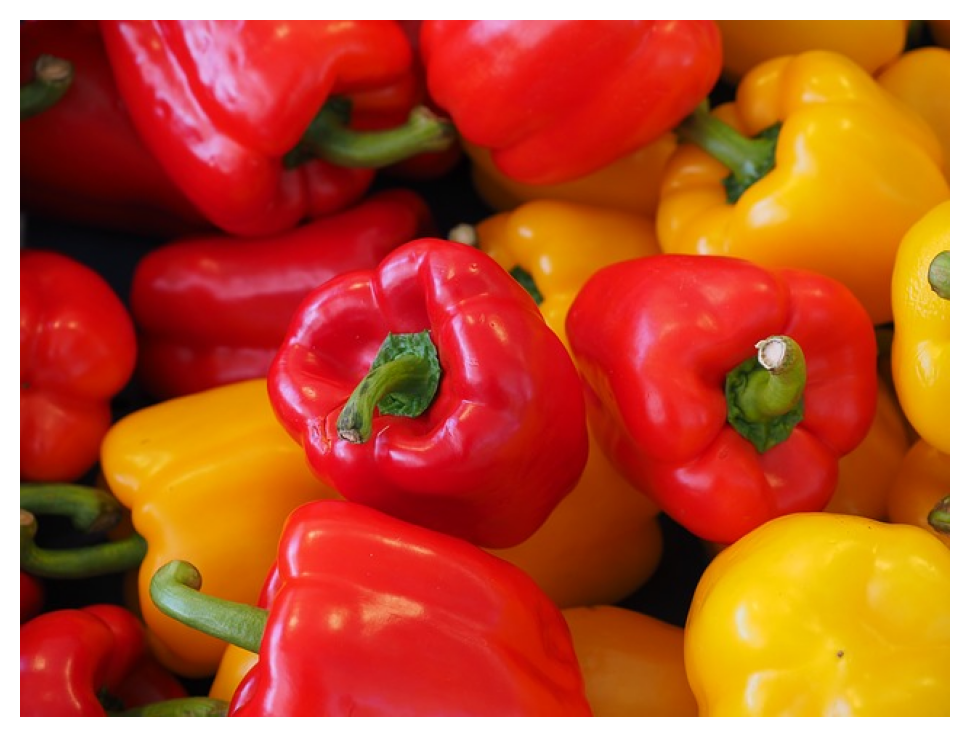

In [14]:
import matplotlib.pyplot as plt
import imageio.v2 as imageio  # Import imageio with v2 for compatibility

# Read image from URL
url = "https://cf-courses-data.s3.us.cloud-object-storage.appdomain.cloud/IBM-ML0187EN-SkillsNetwork/labs/module%201/images/peppers.jpg"
img = imageio.imread(url)

# Display image
plt.imshow(img)
plt.axis('off')  # Hide axes
plt.show()


The image above has 480 pixels in height and 640 pixels in width. Each pixel has 3 values that represent how much red, green and blue it has. Below you can play with different combinations of RGB to create different colors. In total, you can create  2563=16,777,216
256
3
=
16
,
777
,
216
  unique colors

(-0.5, 0.5, 0.5, -0.5)

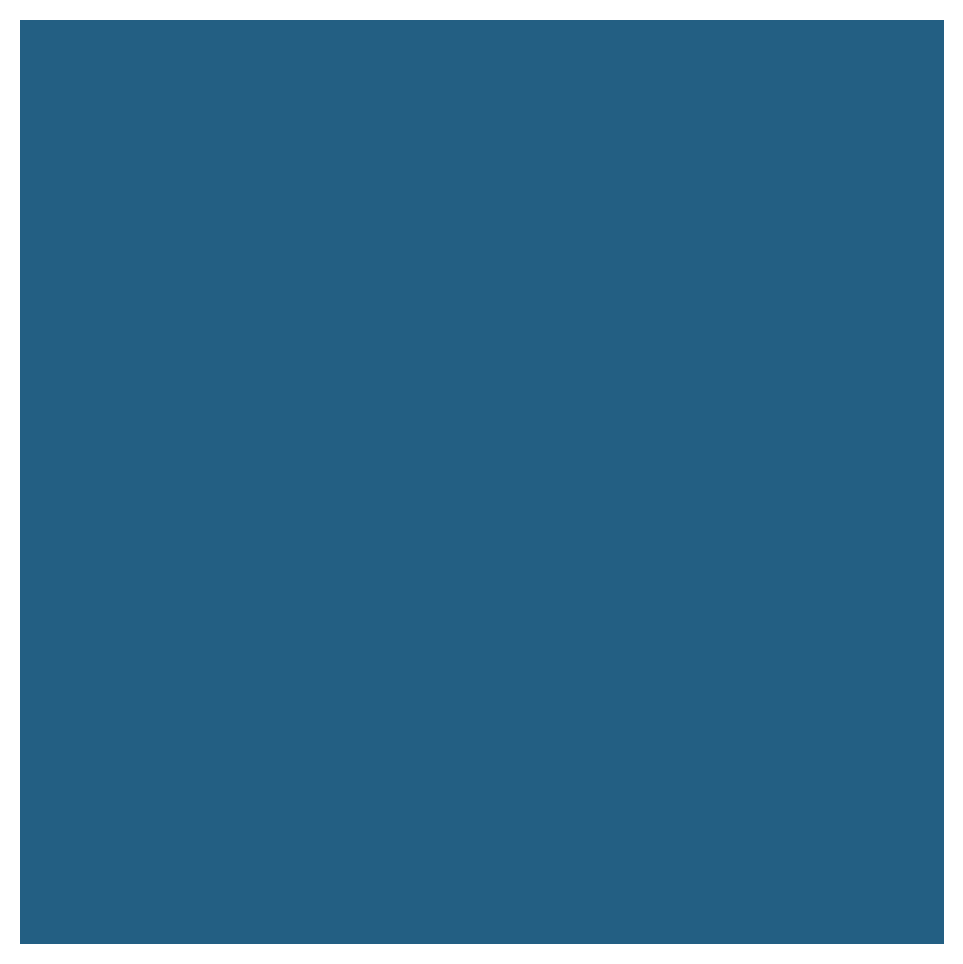

In [16]:
# assign values for the RGB.  Each value should be between 0 and 255
R = 35
G = 95
B = 131
plt.imshow([[np.array([R,G,B]).astype('uint8')]])
plt.axis('off')

In [17]:
img_flat = img.reshape(-1, 3)
img_flat[:5,:]

array([[21, 16, 23],
       [28, 15, 22],
       [45, 14, 22],
       [65, 16, 22],
       [84, 14, 24]], dtype=uint8)

In [18]:
img_flat.shape

(307200, 3)

In [19]:
kmeans = KMeans(n_clusters=8, random_state=0).fit(img_flat)

In [20]:
img_flat2 = img_flat.copy()

# loops for each cluster center
for i in np.unique(kmeans.labels_):
    img_flat2[kmeans.labels_==i,:] = kmeans.cluster_centers_[i]

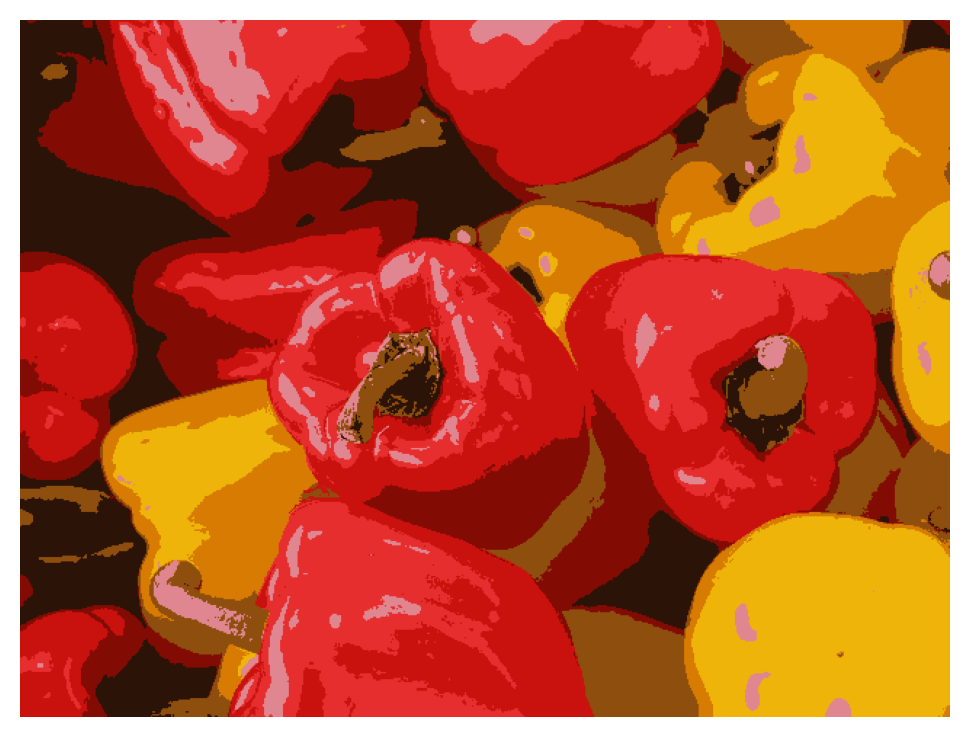

In [21]:
img2 = img_flat2.reshape(img.shape)
plt.imshow(img2)
plt.axis('off');

Problem 2:
Write a function that receives the image and number of clusters (k), and returns (1) the image quantized into k colors, and (2) the inertia.

In [22]:
### BEGIN SOLUTION
def image_cluster(img, k):
    img_flat = img.reshape(img.shape[0]*img.shape[1],3)
    kmeans = KMeans(n_clusters=k, random_state=0).fit(img_flat)
    img_flat2 = img_flat.copy()

    # loops for each cluster center
    for i in np.unique(kmeans.labels_):
        img_flat2[kmeans.labels_==i,:] = kmeans.cluster_centers_[i]

    img2 = img_flat2.reshape(img.shape)
    return img2, kmeans.inertia_
### END SOLUTION

Problem 3:
Call the function for k between 2 and 20, and draw an inertia curve. What is the optimum number of clusters?

In [23]:
### BEGIN SOLUTION
k_vals = list(range(2,21,2))
img_list = []
inertia = []
for k in k_vals:
#    print(k)
    img2, ine = image_cluster(img,k)
    img_list.append(img2)
    inertia.append(ine)

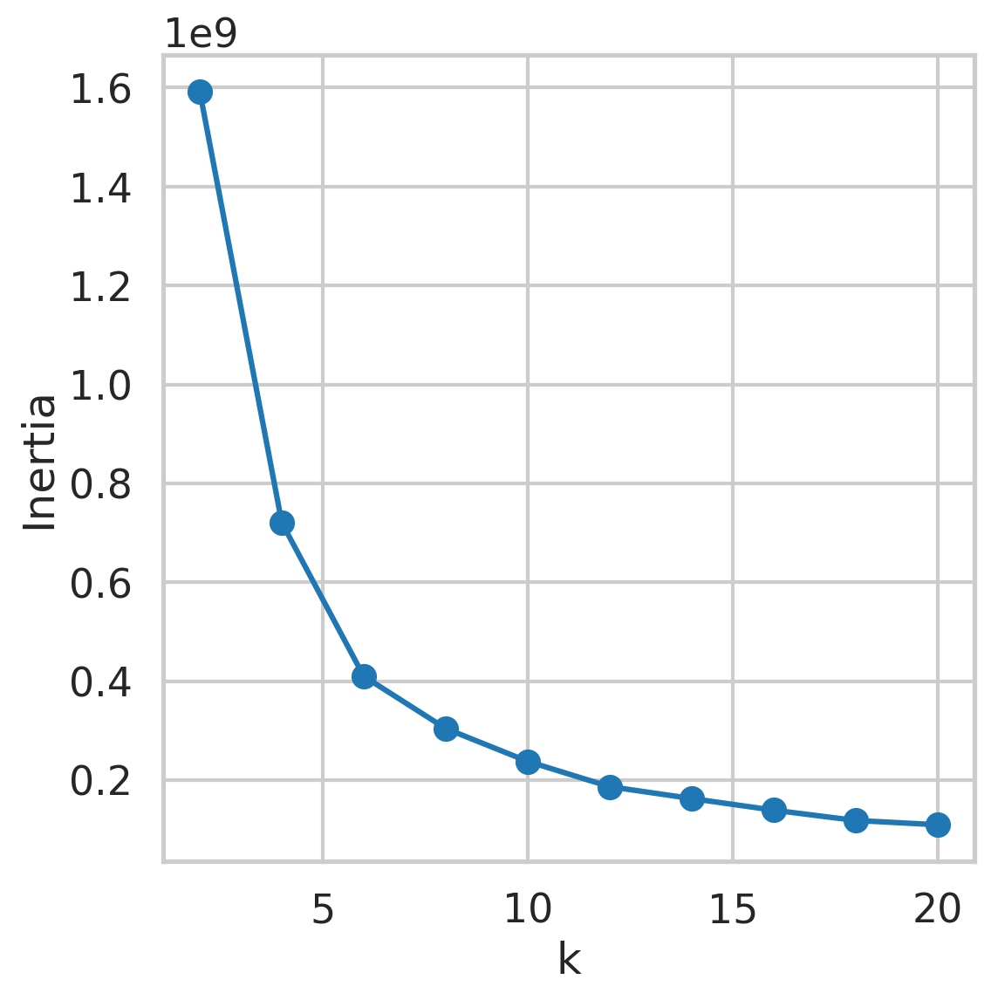

In [24]:
# Plot to find optimal number of clusters
plt.plot(k_vals,inertia)
plt.scatter(k_vals,inertia)
plt.xlabel('k')
plt.ylabel('Inertia');
### END SOLUTION

Sometimes, the elbow method does not yield a clear decision (for example, if the elbow is not clear and sharp, or is ambiguous). In such cases, alternatives such as the silhouette coefficient can be helpful.








Problem 4:
Plot in a grid all the images for the different k values.

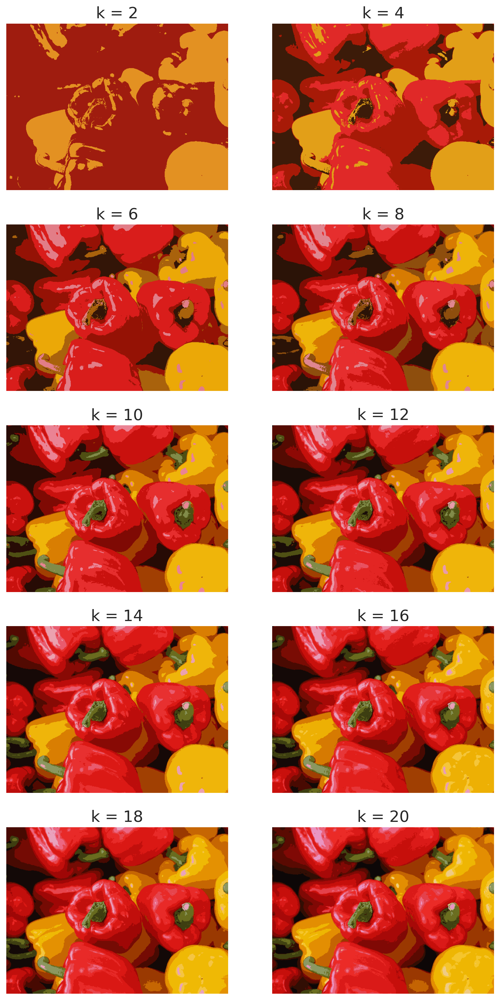

In [25]:
### BEGIN SOLUTION
plt.figure(figsize=[10,20])
for i in range(len(k_vals)):
    plt.subplot(5,2,i+1)
    plt.imshow(img_list[i])
    plt.title('k = '+ str(k_vals[i]))
    plt.axis('off');
### END SOLUTION

In [27]:
# Install required libraries if not already available
!pip install numpy pandas scikit-learn matplotlib

# Import necessary libraries
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans  # Example for clustering


Key Adjustments for Colab:
Removed piplite & await – These are used for Pyodide but are unnecessary in Colab.
Used !pip install – This ensures dependencies are installed in the Colab environment.
Imported essential libraries explicitly – So you can use them without additional installations.

In [29]:
# Suppress warnings
import warnings
warnings.filterwarnings('ignore')

# Import required libraries
import numpy as np
import pandas as pd
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt

# Enable inline plotting for Jupyter/Colab
%matplotlib inline


Key Adjustments for Colab:
Removed skillsnetwork – It is not needed in Colab.
Kept warnings.filterwarnings('ignore') – This ensures warnings don’t clutter the output.
Kept %matplotlib inline – This ensures plots are displayed within the notebook.

Introduction
Problem Statement
Suppose you are a data scientist at MegaMind Sporting Goods Ltd.

You've been tasked with segmenting customers into groups depending on their purchasing habits.

Once you have this information, your colleague John will be able to generate clothing recommendations tailored for each customer group.


About the dataset
We will explore a simple example of customer segmentation using the Mall Customers dataset. This is an artificial dataset that contains data on customers of a shopping mall. In particular, the following features are given about each customer.

CustomerID - A unique identifying number for each the customer
Gender
Age
Annual Income - The annual income of the customer given in thousands of dollars
Spending Score - A value given to the customer based on their spending habits, such as total spending and frequency. A higher value indicates a higher value customer for the mall

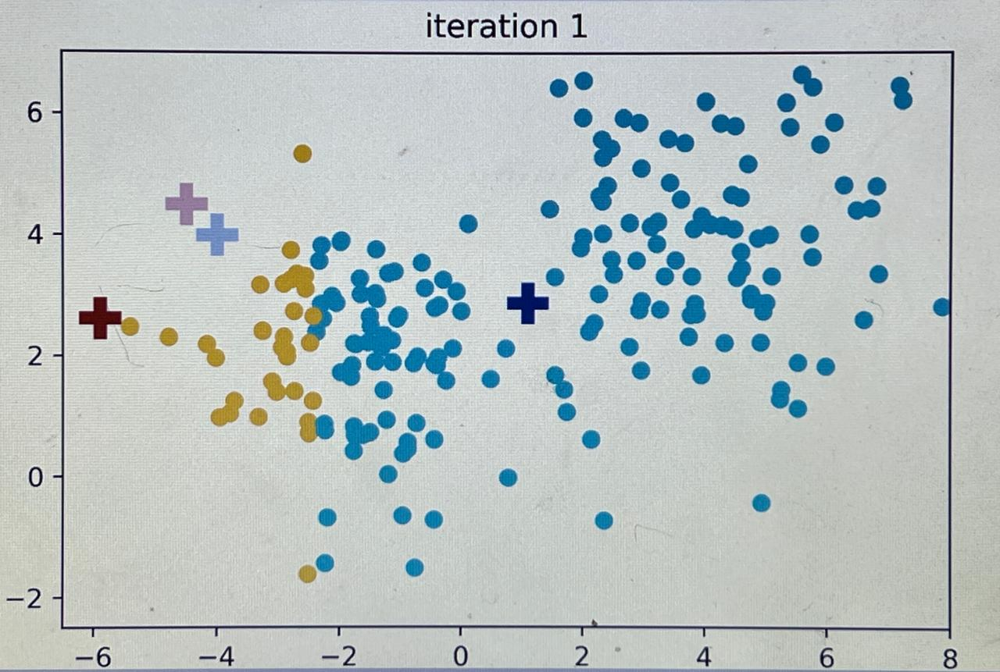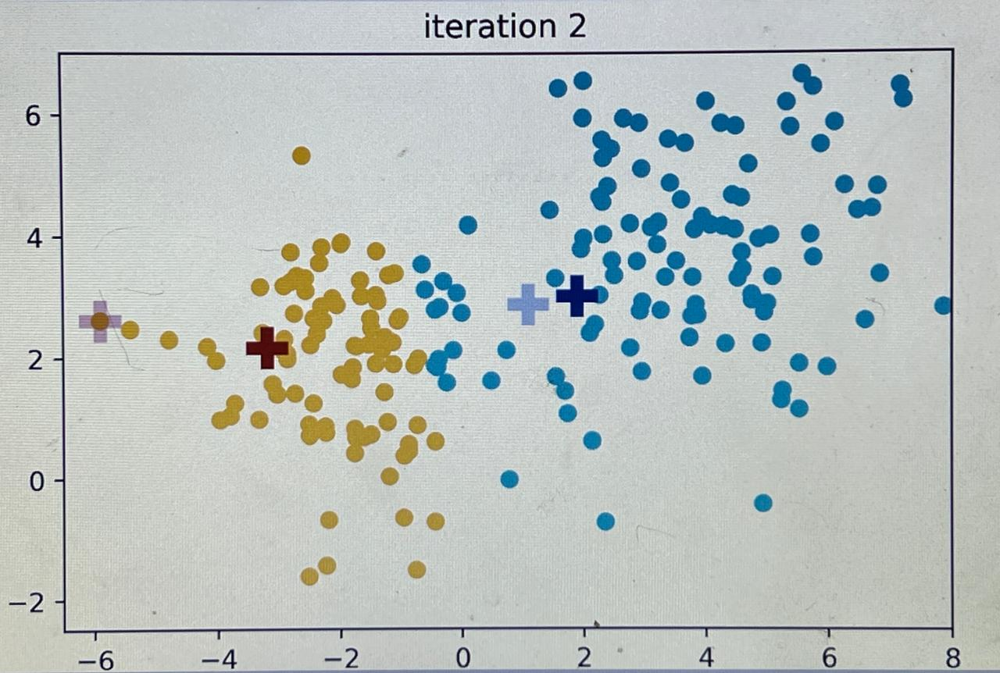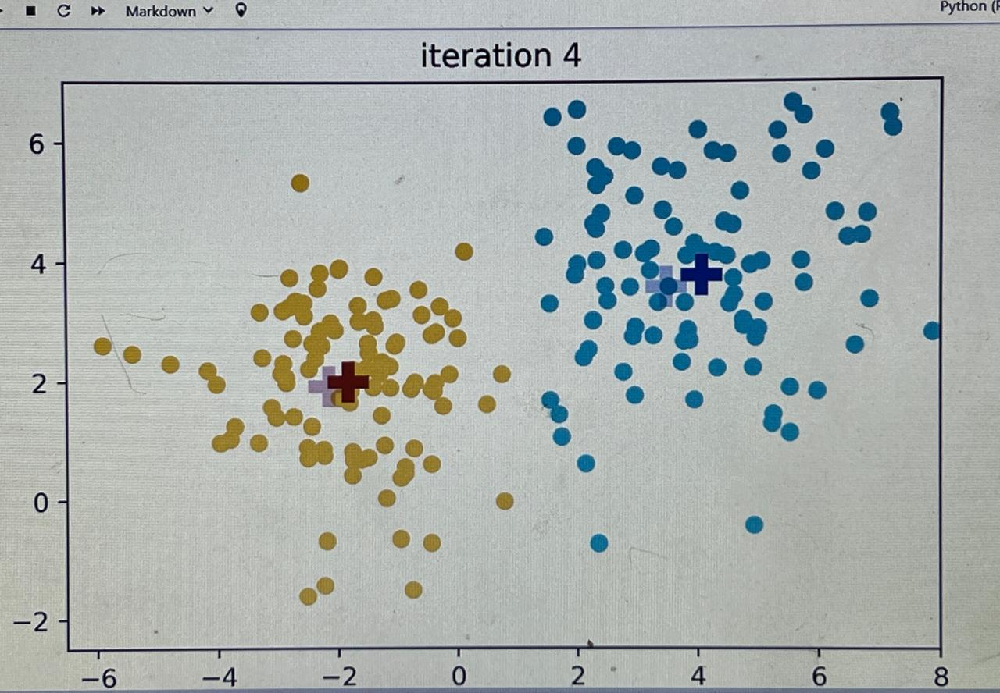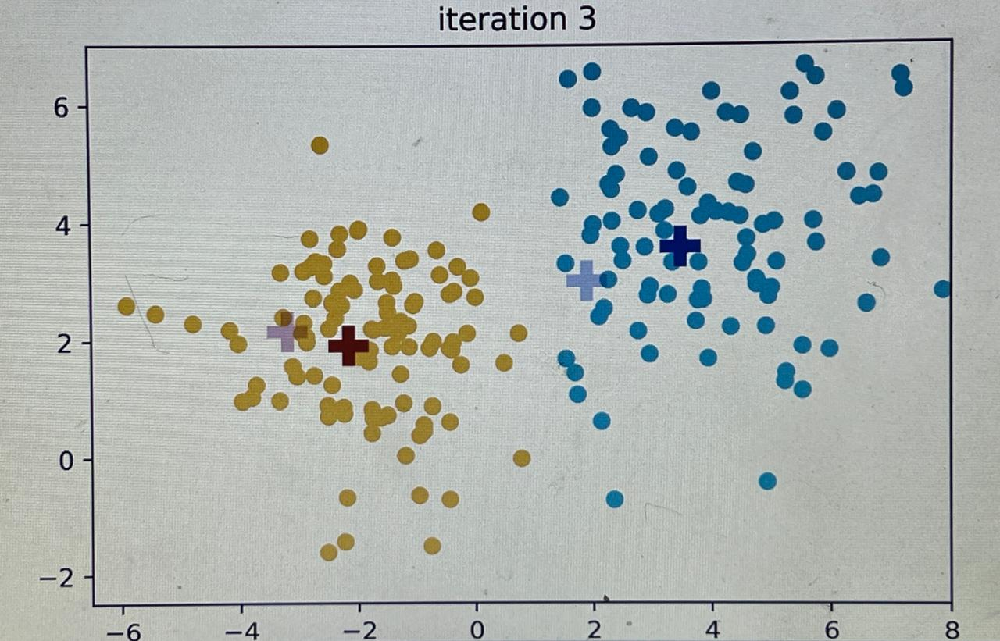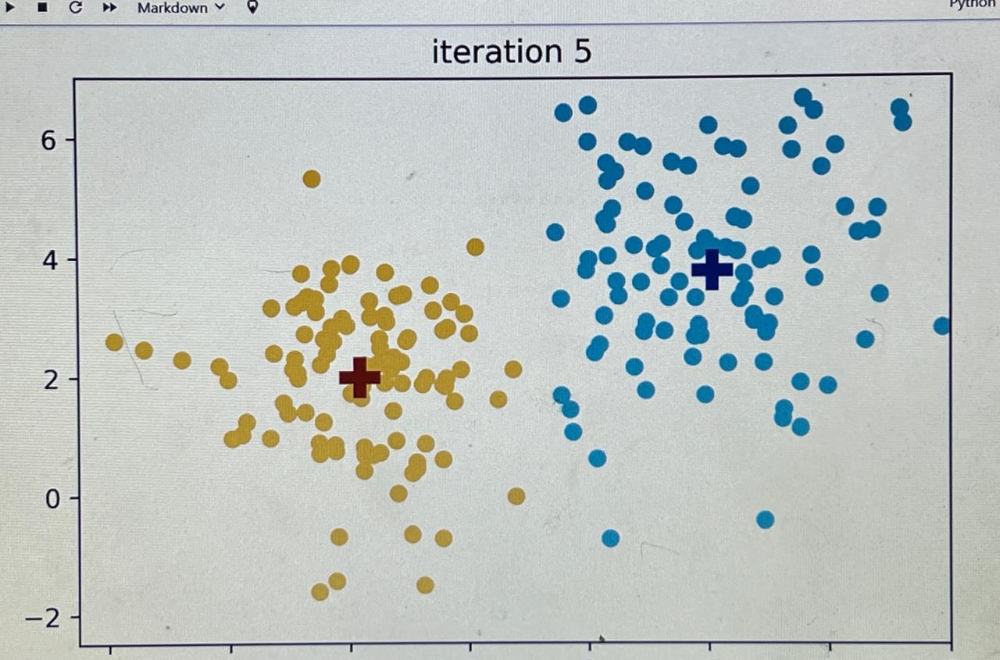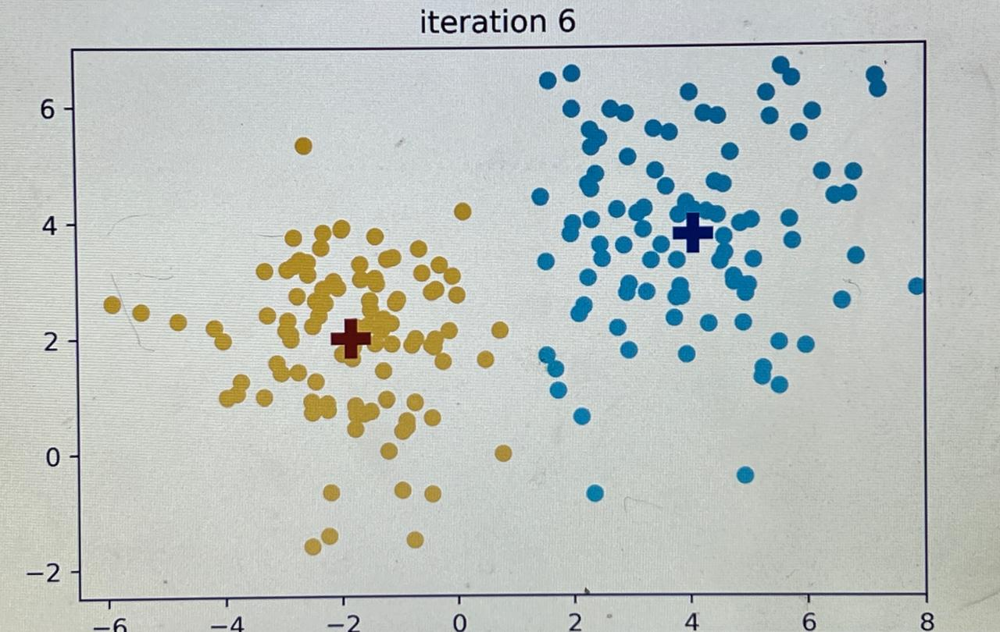

Example 2: Segmenting Customer Data
While the theory and implementation of these algorithms are fascinating in their own right, as data scientists we're driven by the insights we can uncover and the stories we can tell with data.

Now more than ever, companies are making data driven business decisions, in part thanks to the massive increase of data available, as well as the availability of computational power to process and make sense of the data.

Customer segmentation is a process where customers are grouped together based on some common characteristics. For example, customers can be divided based on age, gender, income, marital status, and others. Segmenting customers in this way can have several applications for a business. For instance, common characteristics of the most profitable customers can be identified and a tailored marketing strategy can be implemented to target them.

Let's have a go at customer segmentation using the K Means Clustering algorithm.

Problem Statement
Suppose you are a data scientist at MegaMind Sporting Goods Ltd.

You've been tasked with segmenting customers into groups depending on their purchasing habits.

Once you have this information, your colleague John will be able to generate clothing recommendations tailored for each customer group.


About the dataset
We will explore a simple example of customer segmentation using the Mall Customers dataset. This is an artificial dataset that contains data on customers of a shopping mall. In particular, the following features are given about each customer.

CustomerID - A unique identifying number for each the customer
Gender
Age
Annual Income - The annual income of the customer given in thousands of dollars
Spending Score - A value given to the customer based on their spending habits, such as total spending and frequency. A higher value indicates a higher value customer for the mall

In [31]:
import pandas as pd

# Define dataset URL
url = "https://cf-courses-data.s3.us.cloud-object-storage.appdomain.cloud/IBM-ML0187EN-SkillsNetwork/labs/module%203/data/CustomerData.csv"

# Read dataset directly from URL into a Pandas DataFrame
df = pd.read_csv(url, index_col=0)

# Display the first few rows
df.head()


,Gender,Age,Annual Income (k$),Spending Score (1-100)
CustomerID,,,,
1,Male,19,15,39
2,Male,21,15,81
3,Female,20,16,6
4,Female,23,16,77
5,Female,31,17,40


In [32]:
df.head()

,Gender,Age,Annual Income (k$),Spending Score (1-100)
CustomerID,,,,
1,Male,19,15,39
2,Male,21,15,81
3,Female,20,16,6
4,Female,23,16,77
5,Female,31,17,40


Getting familiar with the data¶
First, let's take a look at the data we have to gain a better general understanding of it before we attempt any clustering.

Let's start by looking at the distributions of some of the features.

We can start by analyzing the ratio of male to female customers that were surveyed.

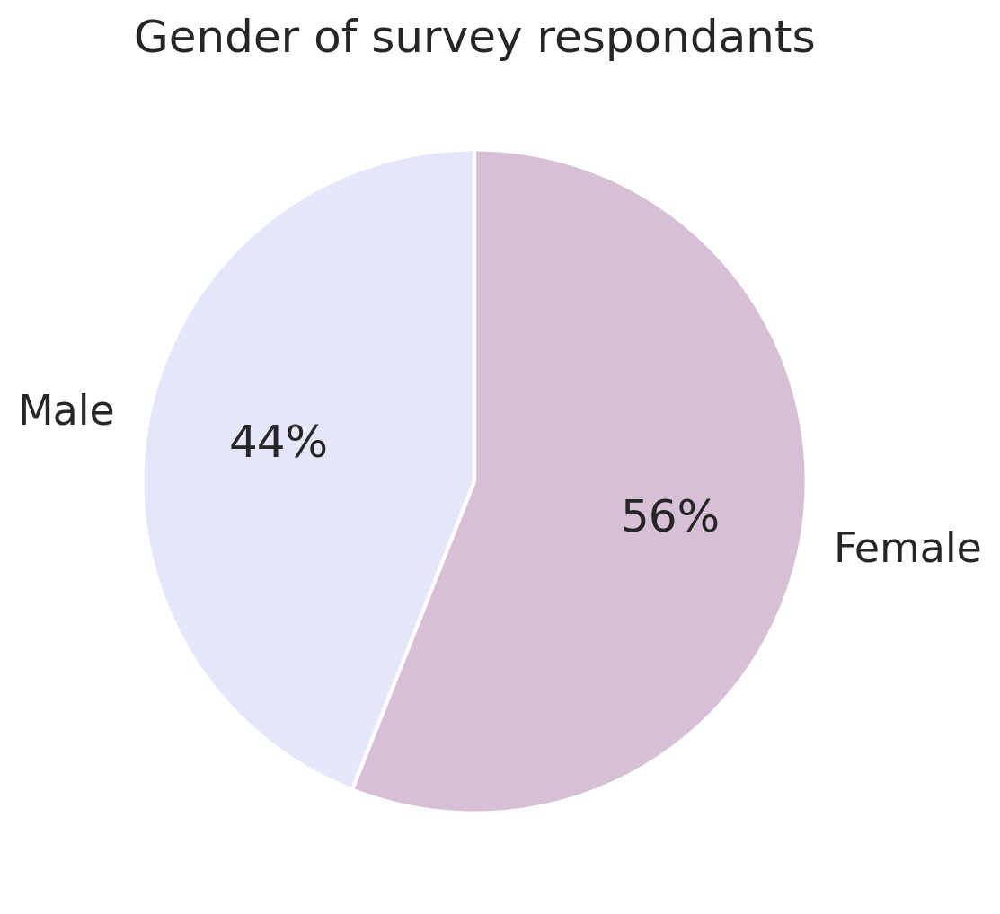

In [33]:
num_male = df[df['Gender'] == 'Male'].shape[0]
num_female = df[df['Gender'] == 'Female'].shape[0]
plt.pie(
    [num_male, num_female],
    labels=['Male', 'Female'],
    startangle=90,
    autopct='%1.f%%',
    colors=['lavender', 'thistle'])
plt.title('Gender of survey respondants')
plt.show()

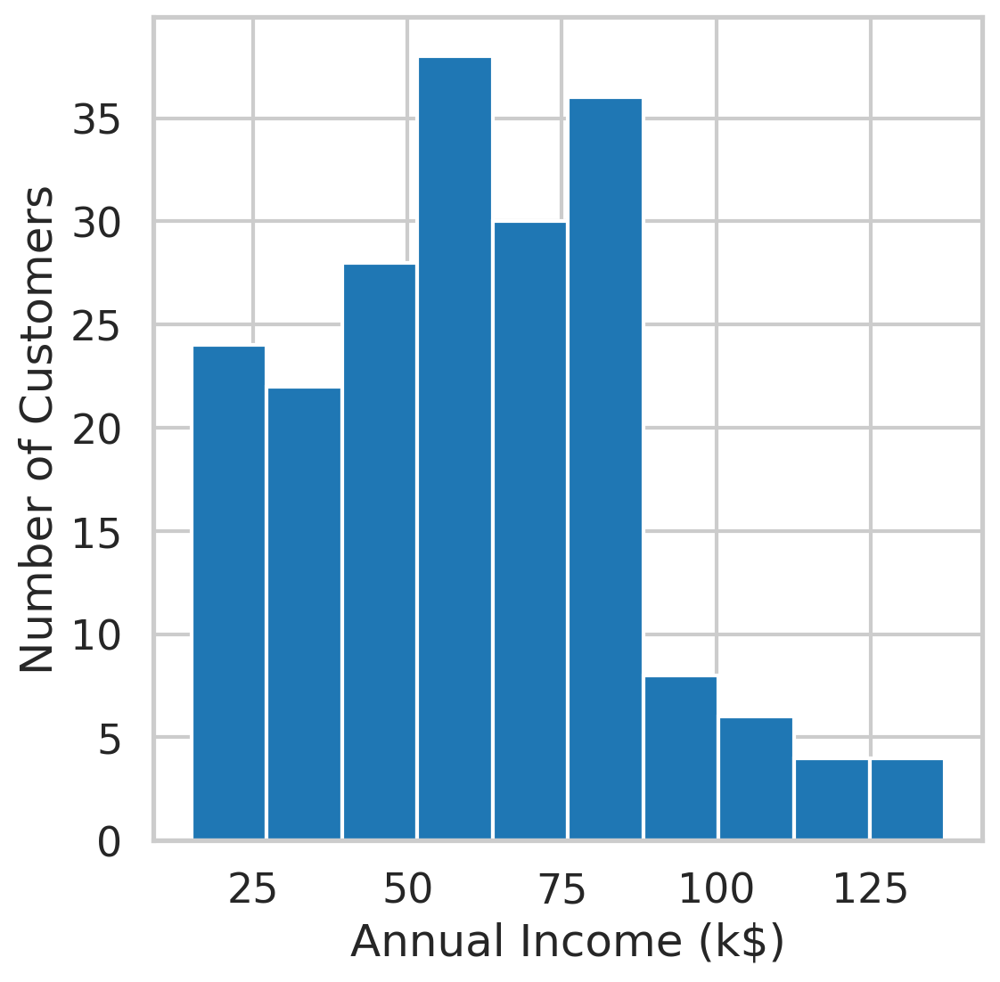

In [34]:
plt.hist(df['Annual Income (k$)'], bins=10)
plt.xlabel('Annual Income (k$)')
plt.ylabel('Number of Customers')
plt.show()

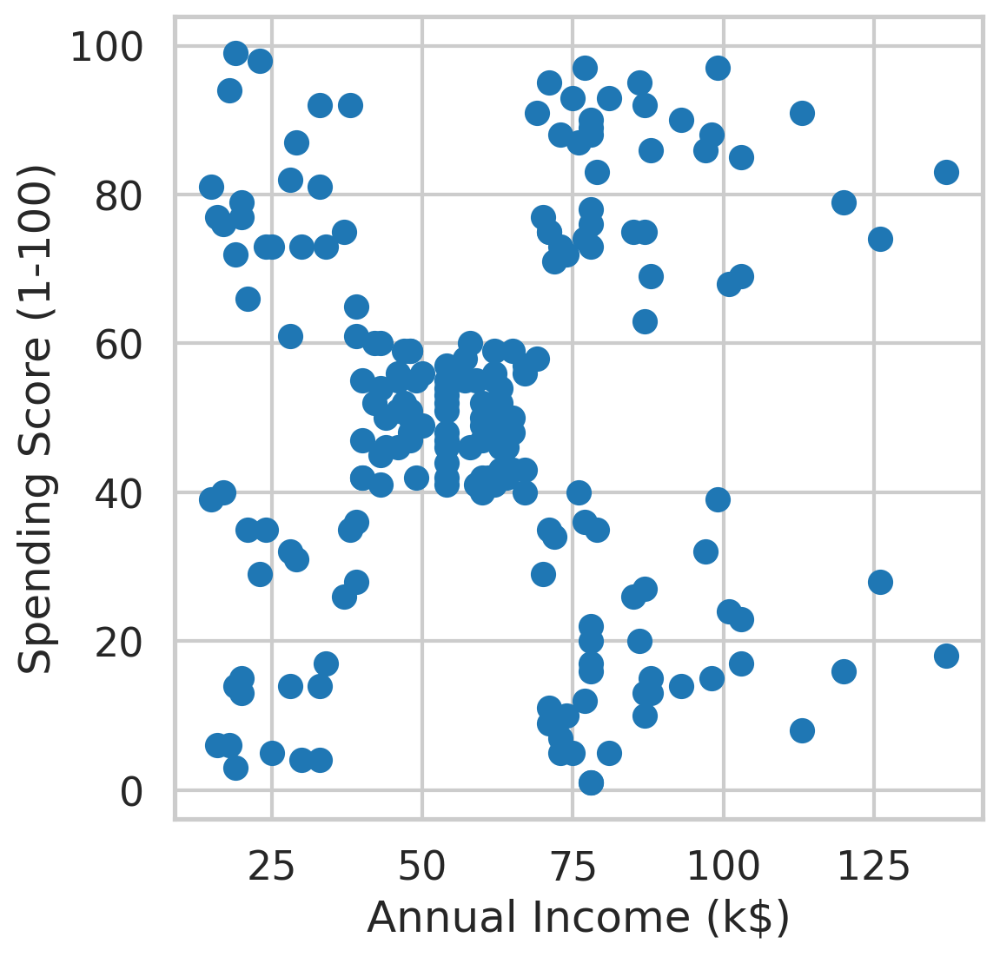

In [35]:
xlabel = 'Annual Income (k$)'
ylabel = 'Spending Score (1-100)'
X = df[[xlabel, ylabel]]
plt.scatter(X[xlabel], X[ylabel])
plt.xlabel(xlabel)
plt.ylabel(ylabel)
plt.show()

This looks promising, we can see our customers seem to fall into ~5 categories:

Low income, high spending.
High income, low spending.
Low income, low spending.
High income, low spending.
Medium income, medium spending.
If we manage to segment our existing customers into these 5 categories, we will obtain exactly the information John requires:


Clusting the data using K Means
Let's start clusting our data!

To do so, we simply load the sklearn.cluster.KMeans object - with our desired number of clusters k = 5:

In [36]:
km = KMeans(n_clusters=5, random_state=42)
km.fit(X)

KMeans(n_clusters=5, random_state=42)

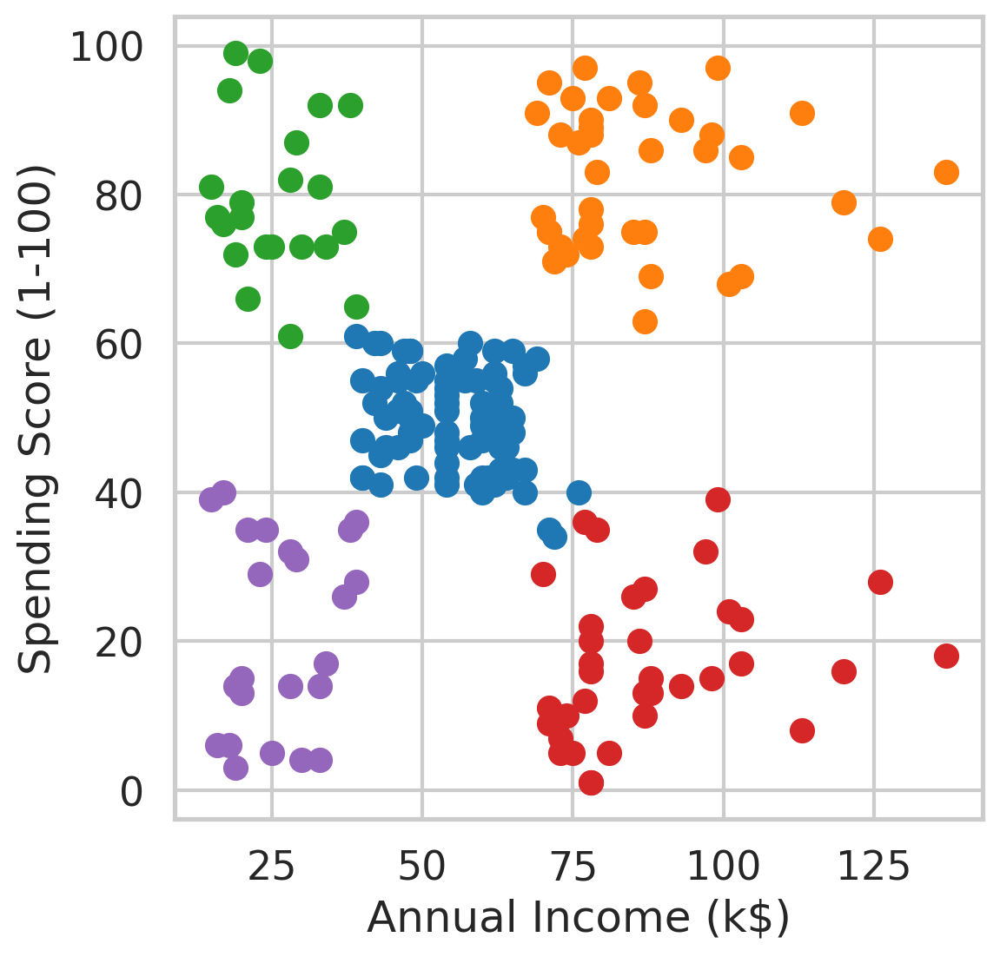

In [37]:
for label in np.unique(km.labels_):
    X_ = X[label == km.labels_]
    plt.scatter(X_['Annual Income (k$)'], X_['Spending Score (1-100)'], label=label)
plt.xlabel(xlabel)
plt.ylabel(ylabel)
plt.show()

Awesome! Our KMeans algorithm was able to correctly group our data into the 5 categories we initially noticed

Example 3: Image Segmentation
Image segmentation is the process of locating objects and boundaries in an image.

Various clustering can be used for this task.

How is this done?:

We cluster pixels using their brightness (grayscale) or rgb values (color).
We replace each pixel with the average brightness or rgb value of pixels in their cluster.
Let's look at an example using KMeans:


Loading the data
Let's start by loading the data into a numpy.array and taking a look at the image:

The image is 490px by 487px


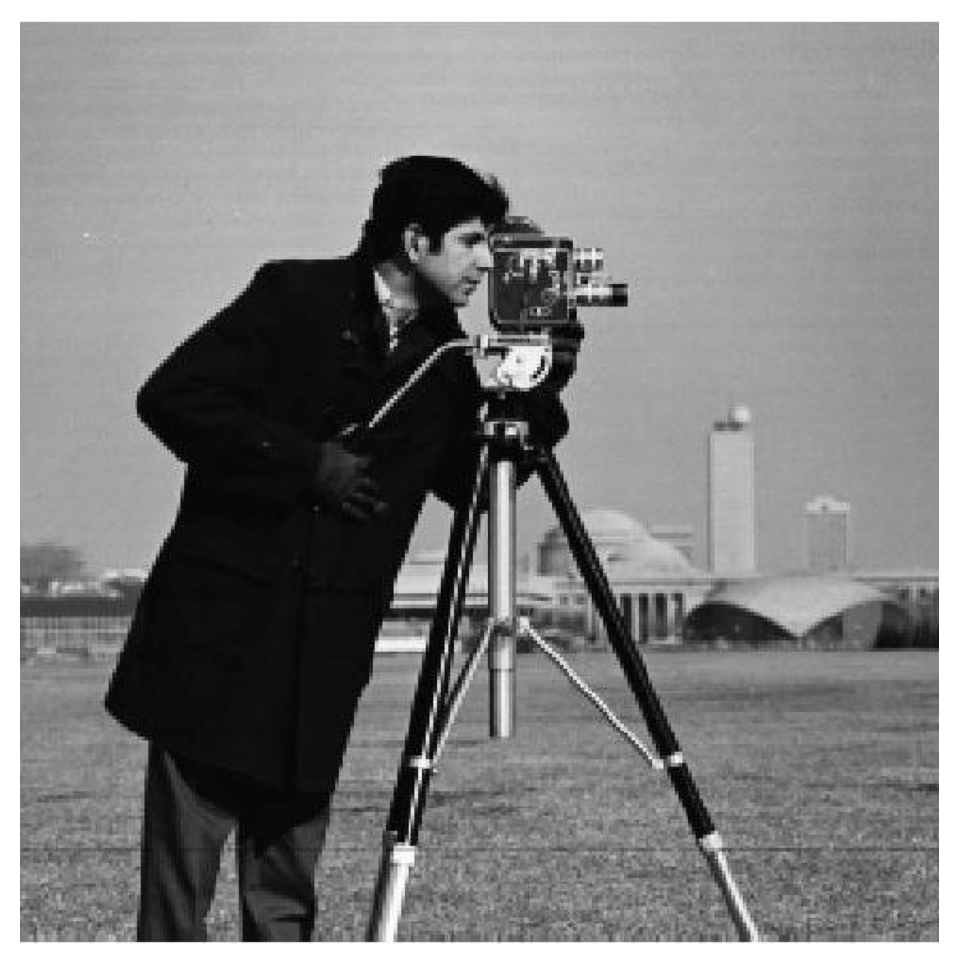

In [38]:
import matplotlib.pyplot as plt
import imageio.v2 as imageio  # Ensuring compatibility with different versions
import requests

# Define image URL
image_url = "https://cf-courses-data.s3.us.cloud-object-storage.appdomain.cloud/IBM-ML0187EN-SkillsNetwork/labs/module%203/images/cameraman.png"
image_filename = "cameraman.png"

# Download the image using requests
response = requests.get(image_url)
with open(image_filename, "wb") as file:
    file.write(response.content)

# Read the image
img = imageio.imread(image_filename)

# Display image size
print(f'The image is {img.shape[0]}px by {img.shape[1]}px')

# Show image
plt.imshow(img, cmap="gray")  # Ensure grayscale images are displayed correctly
plt.axis('off')
plt.show()


Key Adjustments for Colab:
Replaced skillsnetwork.download() with requests.get() to download the image.
Used imageio.imread() instead of plt.imread(), which may have compatibility issues.
Added cmap="gray" for grayscale images to ensure correct display.
Kept plt.show() to render the image properly in Colab.

Segmenting the image using 2 clusters
In this example we will segment our image into k = 2 color-clusters

In [39]:
k = 2

X = img.reshape(-1, 1)
km = KMeans(n_clusters=k, random_state=42)

In [40]:
km.fit(X)

KMeans(n_clusters=2, random_state=42)

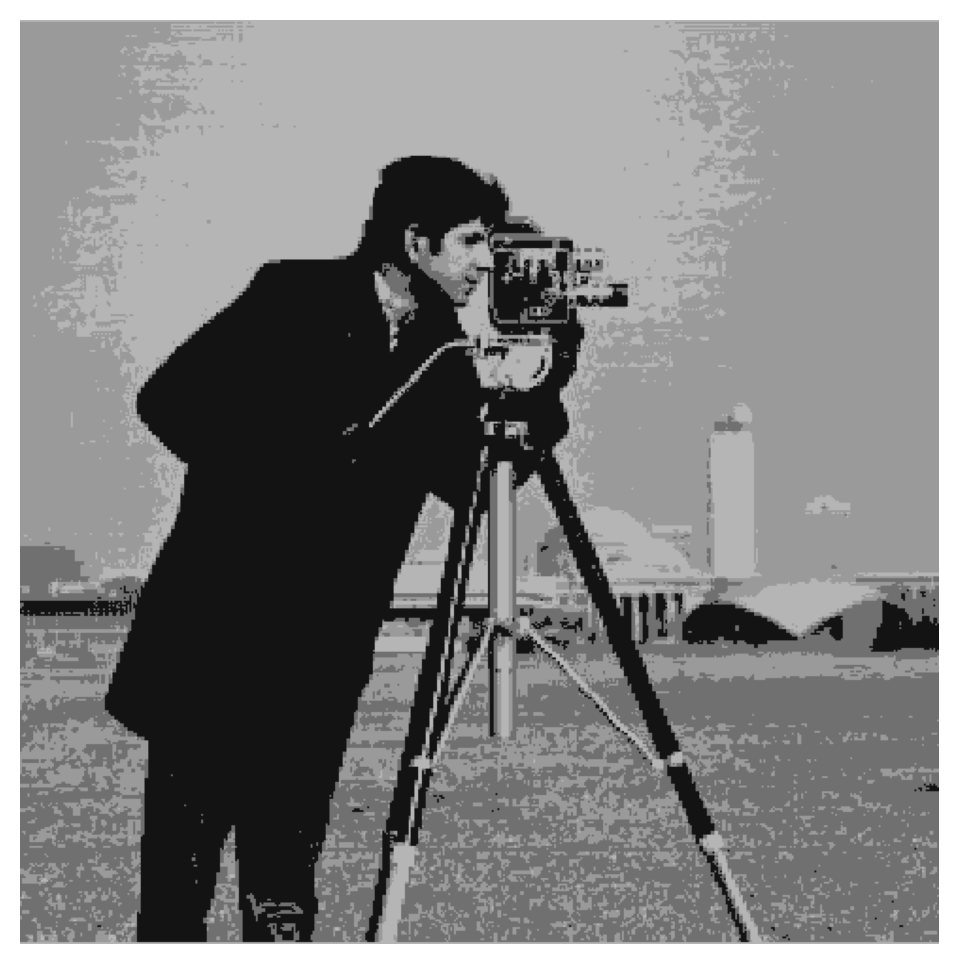

In [43]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans

# Ensure `X` is defined as the image pixels reshaped into a 2D array
X = img.reshape(-1, img.shape[-1])  # Reshape image into 2D array (pixels, channels)

# Define number of clusters
k = 4  # Adjust as needed

# Apply KMeans clustering
km = KMeans(n_clusters=k, random_state=42, n_init=10)
km.fit(X)

# Create segmented image array
seg = np.zeros_like(X)  # Ensure correct shape
for i in range(k):
    seg[km.labels_ == i] = km.cluster_centers_[i]  # Assign cluster center color

# Reshape back to image dimensions
seg = seg.reshape(img.shape)

# Display segmented image
plt.axis('off')
plt.imshow(seg.astype(np.uint8))  # Ensure correct display
plt.show()


Awesome! Even as a human we can still easily recognize our image after segmentation with k = 2 colors.

Converting to black and white
Alternatively we may view the image in black and white:

Key Adjustments for Colab:
Ensured X is defined correctly → X = img.reshape(-1, img.shape[-1])
Set random_state=42 for reproducibility
Added n_init=10 (new versions of sklearn require specifying this)
Used np.zeros_like(X) instead of np.zeros(X.shape) for proper initialization
Ensured correct image display with .astype(np.uint8)

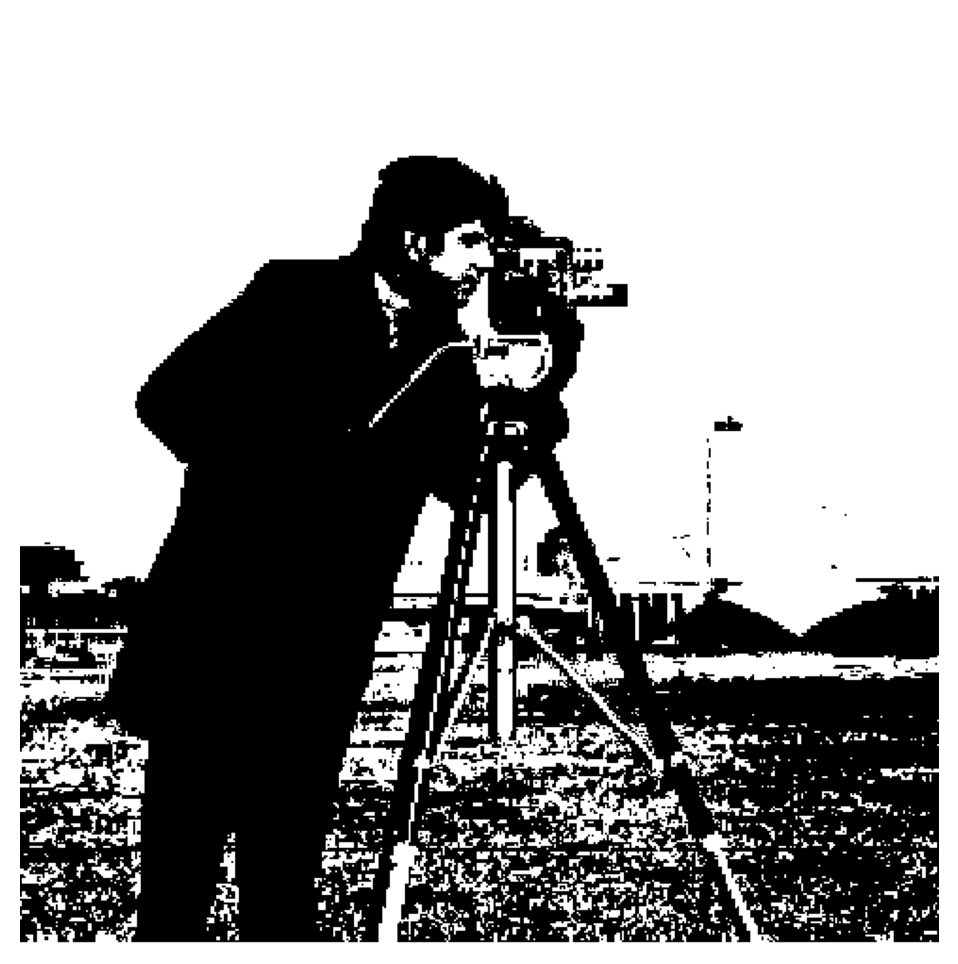

In [44]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans

# Ensure `X` is defined correctly
X = img.reshape(-1, img.shape[-1])  # Reshape image into 2D array (pixels, channels)

# Define number of clusters
k = 4  # Adjust as needed

# Apply KMeans clustering
km = KMeans(n_clusters=k, random_state=42, n_init=10)
km.fit(X)

# Convert segmentation to binary (black & white)
seg = np.zeros(X.shape)  # Ensure correct shape

for i in range(k):
    # Convert based on brightness threshold (average intensity across channels)
    threshold = np.mean(km.cluster_centers_[i])  # Mean intensity of cluster center
    seg[km.labels_ == i] = 255 if threshold > 127 else 0  # Binary thresholding

# Reshape back to image dimensions and ensure correct format
seg = seg.reshape(img.shape).astype(np.uint8)

# Display binary image
plt.axis('off')
plt.imshow(seg, cmap="gray")  # Force grayscale for proper display
plt.show()


Key Fixes & Enhancements:
Fixed Binary Thresholding Issue:
km.cluster_centers_[i] is a vector (for RGB images).
Used np.mean(km.cluster_centers_[i]) to get an intensity value.
Set threshold at 127 (midpoint for 8-bit images, instead of 0.5).
Ensured np.zeros(X.shape) is correct for multi-channel images.
Used astype(np.uint8) to avoid display errors.
Added cmap="gray" to force grayscale display.

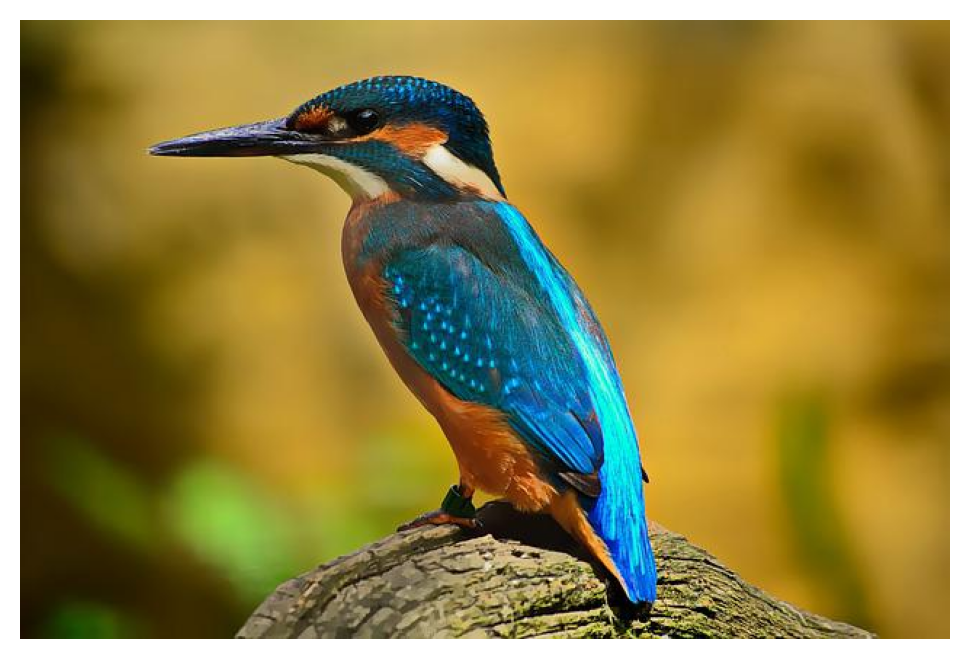

In [45]:
import urllib.request
import matplotlib.pyplot as plt

# Download the image
image_url = "https://cf-courses-data.s3.us.cloud-object-storage.appdomain.cloud/IBM-ML0187EN-SkillsNetwork/labs/module%203/images/kingfisher.jpeg"
urllib.request.urlretrieve(image_url, "kingfisher.jpeg")  # Save image locally

# Read and display the image
img = plt.imread("kingfisher.jpeg")
plt.axis("off")  # Remove axes
plt.imshow(img)
plt.show()


Exercise 1 - Fitting KMeans With k=2

In [46]:
k = 2

X = img.reshape(-1, 3) # Remember, since image is RGB
km = KMeans(n_clusters=k, random_state=42)
km.fit(X)

KMeans(n_clusters=2, random_state=42)

Exercise 2 - Viewing Segmented Image

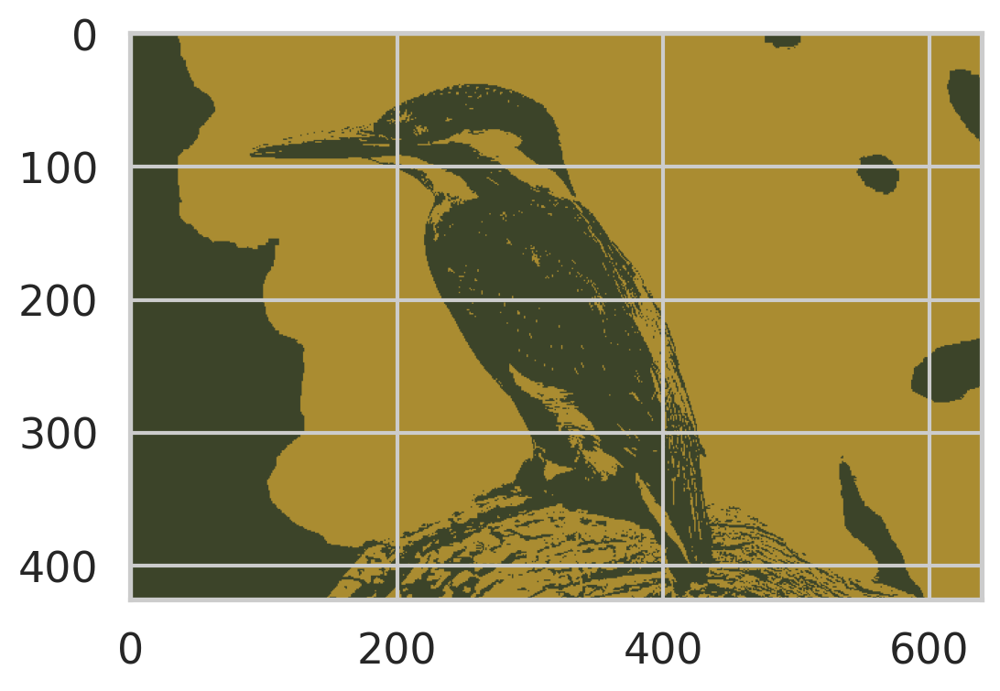

In [47]:
seg = np.zeros(X.shape)
for i in range(k):
    seg[km.labels_ == i] = km.cluster_centers_[i]
seg = seg.reshape(img.shape).astype(np.uint8)
plt.imshow(seg)

Exercise 3 - Fitting KMeans With k=4 and Viewing Segmented Image

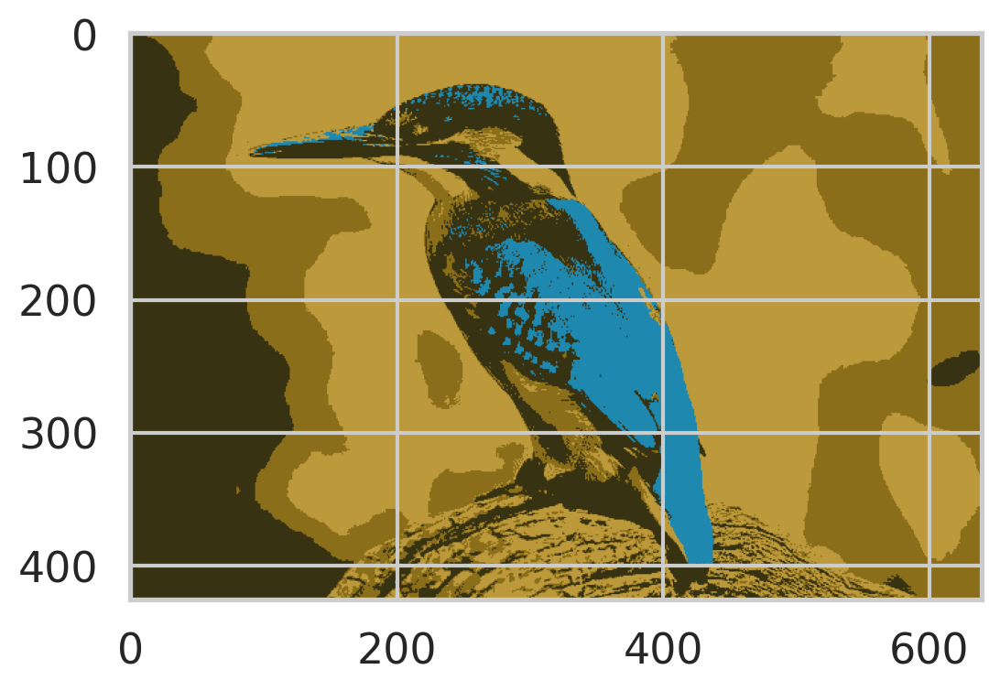

In [48]:
k = 4

X = img.reshape(-1, 3) # Remember, since image is rgb
km = KMeans(n_clusters=k, random_state=42)
km.fit(X)

seg = np.zeros(X.shape)
for i in range(k):
    seg[km.labels_ == i] = km.cluster_centers_[i]
seg = seg.reshape(img.shape).astype(np.uint8)
plt.imshow(seg)

Gaussian Mixture Models
Estimated time needed: 45 minutes

Use cases of GMM:
Recommender systems that make recommendations to users based on preferences (such as Netflix viewing patterns) of similar users (such as neighbors).
Anomaly detection that identifies rare items, events or observations which deviate significantly from the majority of the data and do not conform to a well defined notion of normal behavior.
Customer segmentation that aims at separating customers into multiple clusters, and devise targeted marketing strategy based on each cluster's characteristics.
When is GMM better than K-Means?
Imagine you are a Data Scientist who builds a recommender for selling cars using K-Means clustering and you have two clusters. Everybody in cluster A is recommended to buy car A, which costs 100k with a 25k profit margin, and everyone in cluster B is recommended to buy car B, which costs 50k with a 10k profit margin.

Let's say you want to get as many people in cluster A as possible, why not use an algorithm that informs you of exactly how likely somebody would be interested in purchasing car A, instead of one that only tells you a hard yes or no (This is what K-Means does!).

With GMM, not only will you be getting the predicted cluster labels, the algorithm will also give you the probability of a data point belonging to a cluster. How amazing is that!

Whoever, is selling those cars should definitely work on a better plan for a customer with a 90% chance of purchasing, than for someone with a 75% chance of purchasing, even though they might show up in the same cluster.


In this lab, you will be applying clustering analysis on multivariate datasets using Gaussian Mixture Models (GMM).

Table of Contents
Objectives
Setup
Installing Required Libraries
Importing Required Libraries
Defining Helper Functions
What are Gaussian Mixture Models (GMM)?
Background
Playing around with means, standard deviations, and weights
Introducing sklearn.mixture.GaussianMixture
GMM.predict_proba
Example 1: Applying GMM on a 2d dataset
Generate an artificial 2d Gaussian mixture data
Fit a GMM
Plot the clusters
Try different values of Covariance_type
Example 2: Applying GMM on real world data - Image Segmentation
Exercises

Exercise 1 - Scale the data (using StandardScaler)
Exercise 2 - Use PCA with n_components=2 for dimension reduction
Exercise 3 - Fit a GMM to the reduced data
Exercise 4 - Output the predicted labels for visualizing clusters
Exercise 5 - Clustering and visualizing using 3 principal components (OPTIONAL)
Objectives
After completing this lab you will be able to:

Understand what Gaussian mixture is and how its distribution parameters affect the prior probabilities.
Understand what Gaussian mixture model is and how it works as a clustering technique.
Apply GMM effectively.
Setup
For this lab, we will be using the following libraries:

pandas for managing the data.
numpy for mathematical operations.
sklearn for machine learning and machine-learning-pipeline related functions.
seaborn for visualizing the data.
matplotlib for additional plotting tools.







Installing Required Libraries
The following required libraries are pre-installed in the Skills Network Labs environment. However, if you run this notebook commands in a different Jupyter environment (e.g. Watson Studio or Ananconda), you will need to install these libraries by removing the # sign before !mamba in the code cell below.

In [51]:
# Install required libraries
!pip install -q pandas==1.3.4 numpy==1.21.4 seaborn==0.9.0 matplotlib==3.5.0 scikit-learn==0.20.1 wget


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.7/4.7 MB 36.4 MB/s eta 0:00:00
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
ERROR: Ignored the following versions that require a different python version: 1.21.2 Requires-Python >=3.7,<3.11; 1.21.3 Requires-Python >=3.7,<3.11; 1.21.4 Requires-Python >=3.7,<3.11; 1.21.5 Requires-Python >=3.7,<3.11; 1.21.6 Requires-Python >=3.7,<3.11
ERROR: Could not find a version that satisfies the requirement numpy==1.21.4 (from versions: 1.3.0, 1.4.1, 1.5.0, 1.5.1, 1.6.0, 1.6.1, 1.6.2, 1.7.0, 1.7.1, 1.7.2, 1.8.0, 1.8.1, 1.8.2, 1.9.0, 1.9.1, 1.9.2, 1.9.3, 1.10.0.post2, 1.10.1, 1.10.2, 1.10.4, 1.11.0, 1.11.1, 1.11.2, 1.11.3, 1.12.0, 1.12.1, 1.13.0, 1.13.1, 1.13.3, 1.14.0, 1.14.1, 1.14.2, 1.14.3, 1.14.4, 1.14.5, 1.14.6, 1.15.0, 1.15.1, 1.15.2, 1.15.3, 1.15.4, 1.16.0, 1.16.1, 1.16.2, 1.16.3, 1.16.4, 1.16.5, 1.16.6, 1.17.0, 1.17.1, 1.17.2, 1.17.3, 1.17.4, 1.17.5, 1.18.0

In [52]:
# You can also use this section to suppress warnings generated by your code:
import warnings
warnings.filterwarnings('ignore')


import numpy as np
import pandas as pd
import scipy.stats as ss
import matplotlib.pyplot as plt
%matplotlib inline
from sklearn.mixture import GaussianMixture
import seaborn as sns

from sklearn.preprocessing import StandardScaler
from scipy.stats import multivariate_normal
from itertools import chain
from matplotlib.patches import Ellipse


sns.set_context('notebook')
sns.set_style('white')

def warn(*args, **kwargs):
    pass
import warnings
warnings.warn = warn
warnings.filterwarnings('ignore')

Defining Helper Functions
Use this section to define any helper functions to help the notebook's code readability:

In [55]:
# This function will allow us to easily plot data taking in x values, y values, and a title
def plot_univariate_mixture(means, stds, weights, N = 10000, seed=10):

    """
    returns the simulated 1d dataset X, a figure, and the figure's ax

    """
    np.random.seed(seed)
    if not len(means)==len(stds)==len(weights):
        raise Exception("Length of mean, std, and weights don't match.")
    K = len(means)

    mixture_idx = np.random.choice(K, size=N, replace=True, p=weights)
    # generate N possible values of the mixture
    X = np.fromiter((ss.norm.rvs(loc=means[i], scale=stds[i]) for i in mixture_idx), dtype=np.float64)

    # generate values on the x axis of the plot
    xs = np.linspace(X.min(), X.max(), 300)
    ps = np.zeros_like(xs)

    for mu, s, w in zip(means, stds, weights):
        ps += ss.norm.pdf(xs, loc=mu, scale=s) * w

    fig, ax = plt.subplots()
    ax.plot(xs, ps, label='pdf of the Gaussian mixture')
    ax.set_xlabel("X", fontsize=15)
    ax.set_ylabel("P", fontsize=15)
    ax.set_title("Univariate Gaussian mixture", fontsize=15)
    #plt.show()

    return X.reshape(-1,1), fig, ax


def plot_bivariate_mixture(means, covs, weights, N = 10000, seed=10):

    """
    returns the simulated 2d dataset X and a scatter plot is shown

    """
    np.random.seed(seed)
    if not len(mean)==len(covs)==len(weights):
        raise Exception("Length of mean, std, and weights don't match.")
    K = len(means)
    M = len(means[0])

    mixture_idx = np.random.choice(K, size=N, replace=True, p=weights)

    # generate N possible values of the mixture
    X = np.fromiter(chain.from_iterable(multivariate_normal.rvs(mean=means[i], cov=covs[i]) for i in mixture_idx),
                dtype=float)
    X.shape = N, M

    xs1 = X[:,0]
    xs2 = X[:,1]

    plt.scatter(xs1, xs2, label="data")

    L = len(means)
    for l, pair in enumerate(means):
        plt.scatter(pair[0], pair[1], color='red')
        if l == L-1:
            break
    plt.scatter(pair[0], pair[1], color='red', label="mean")

    plt.xlabel("$x_1$")
    plt.ylabel("$x_2$")
    plt.title("Scatter plot of the bivariate Gaussian mixture")
    plt.legend()
    plt.show()

    return X


def draw_ellipse(position, covariance, ax=None, **kwargs):

    """
    Draw an ellipse with a given position and covariance

    """
    ax = ax or plt.gca()

    # Convert covariance to principal axes
    if covariance.shape == (2, 2):
        U, s, Vt = np.linalg.svd(covariance)
        angle = np.degrees(np.arctan2(U[1, 0], U[0, 0]))
        width, height = 2 * np.sqrt(s)
    else:
        angle = 0
        width, height = 2 * np.sqrt(covariance)

    # Draw the Ellipse
    for nsig in range(1, 4):
        ax.add_patch(Ellipse(position, nsig * width, nsig * height, angle, **kwargs))


def plot_gmm(gmm, X, label=True, ax=None):
    ax = ax or plt.gca()
    labels = gmm.fit(X).predict(X)
    if label:
        ax.scatter(X[:, 0], X[:, 1], c=labels, s=40, cmap='viridis', zorder=2)
    else:
        ax.scatter(X[:, 0], X[:, 1], s=40, zorder=2)
    ax.axis('equal')

    w_factor = 0.2 / gmm.weights_.max()
    for pos, covar, w in zip(gmm.means_, gmm.covariances_, gmm.weights_):
        draw_ellipse(pos, covar, alpha=w * w_factor)

What are Gaussian Mixture Models (GMM)?
Put simply, Gaussian Mixture Models (GMM) is a clustering algorithm that:

Fits a weighted combination of Gaussian distributions to your data
The data scientist (you) needs to determine the number of gaussian distributions (k)
Hard vs Soft Clustering:

Hard clustering algorithms assign each data point to exactly one cluster.
Soft clustering algorithms return probabilities of each data point belonging to all k clusters
GMM is a soft clustering algorithm.

Background
A Gaussian mixture is a weighted combination of (k) Gaussians, where each is identified by the following parameters:

a mean vector  𝝁𝑖
𝜇
𝑖

a covariance matrix  𝚺𝑖
𝛴
𝑖

a component weight  𝜋𝑖
𝜋
𝑖
  that indicates the contribution of the  𝑖
𝑖
 th Gaussian
When put altogether, the pdf of the mixture model is formulated as:

𝑝(𝒙)=∑𝑖=1𝐾𝜋𝑖(𝑥|𝝁𝒊,𝚺𝒊),∑𝑖=1𝐾𝜋𝑖=1
𝑝
(
𝑥
)
=
∑
𝑖
=
1
𝐾
𝜋
𝑖
𝑁
(
𝑥
|
𝜇
𝑖
,
𝛴
𝑖
)
,
∑
𝑖
=
1
𝐾
𝜋
𝑖
=
1

Before we start applying the model in a multivariate setting, let's delve into the three parameters and see how changing the parameter values affect the appearance of the Gaussian mixture in a lower dimension.

We will use the helper function plot_univariate_mixture to plot the mixture efficiently.








Playing around with means, standard deviations, and weights
Let's start with a mixture of 3 univariate Gaussians with

means equal to 2, 5, 8 respectively
std equal to 0.2, 0.5, 0.8 respectively
component weight equal to 0.3, 0.3, 0.4 respectively

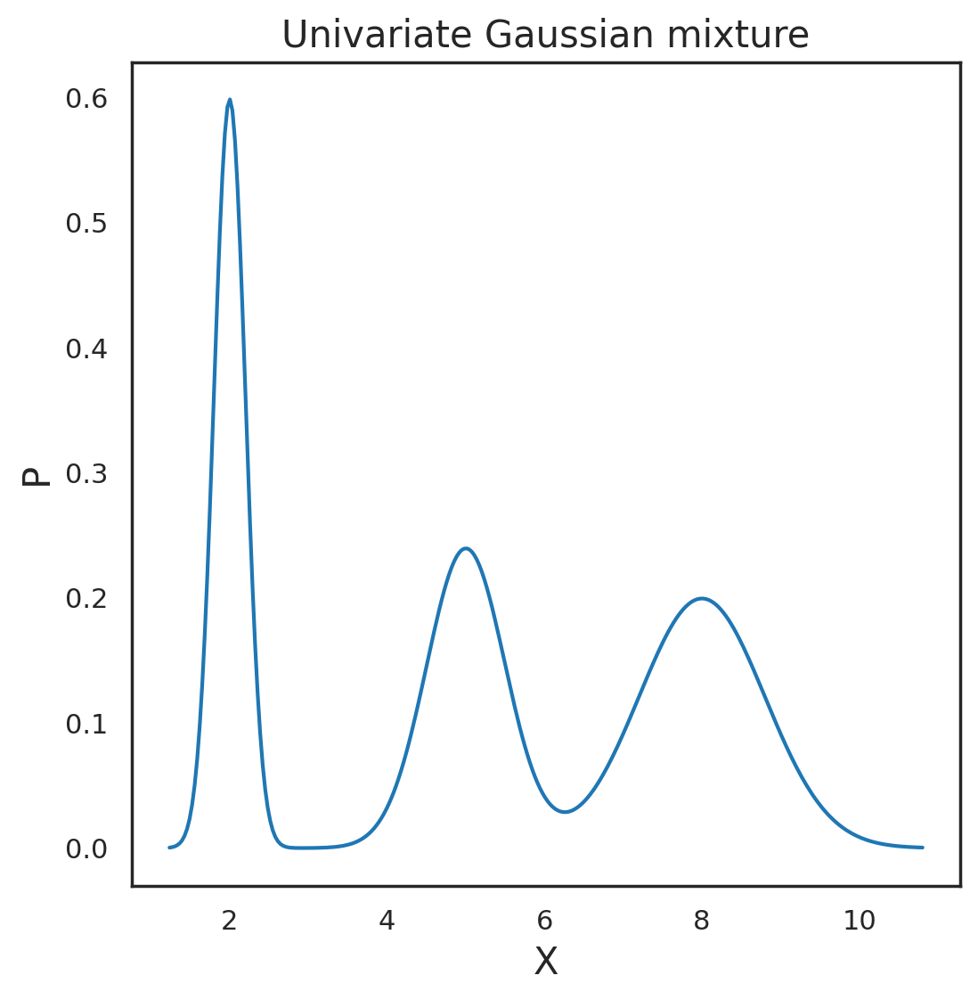

In [56]:
X1, fig1, ax1 = plot_univariate_mixture(means=[2,5,8], stds=[0.2, 0.5, 0.8], weights=[0.3, 0.3, 0.4])

The peaks in the distribution (pdf) plot above are around the x = 2, 5, 8, which are the means of our Gaussians.

If we increase the value of the standard deviations, we will see the bell shapes become wider and there will be overlaps between two Gaussians.

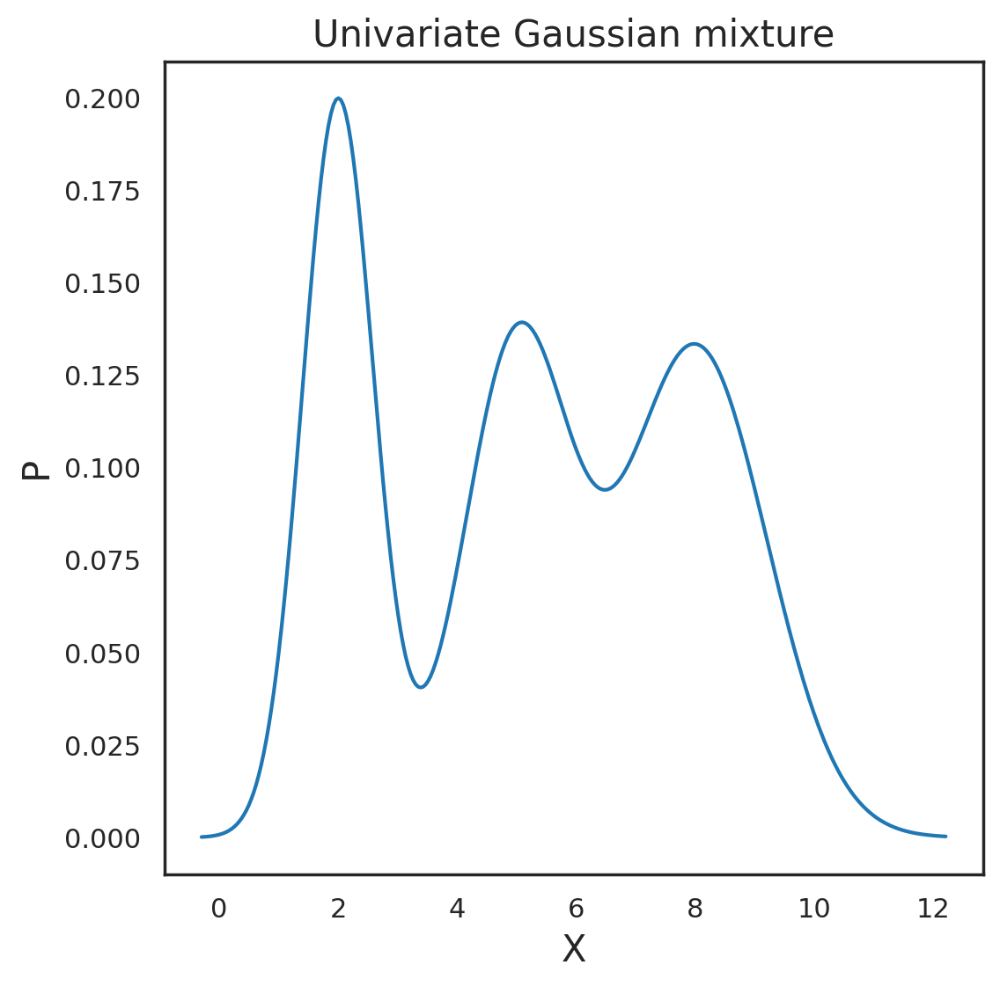

In [57]:
X2, fig2, ax2 = plot_univariate_mixture(means=[2,5,8], stds=[0.6, 0.9, 1.2], weights=[0.3, 0.3, 0.4])

Keeping the means and standard deviations unchanged, let's change the weights of the Gaussians and see how it affects the mixture's distribution.

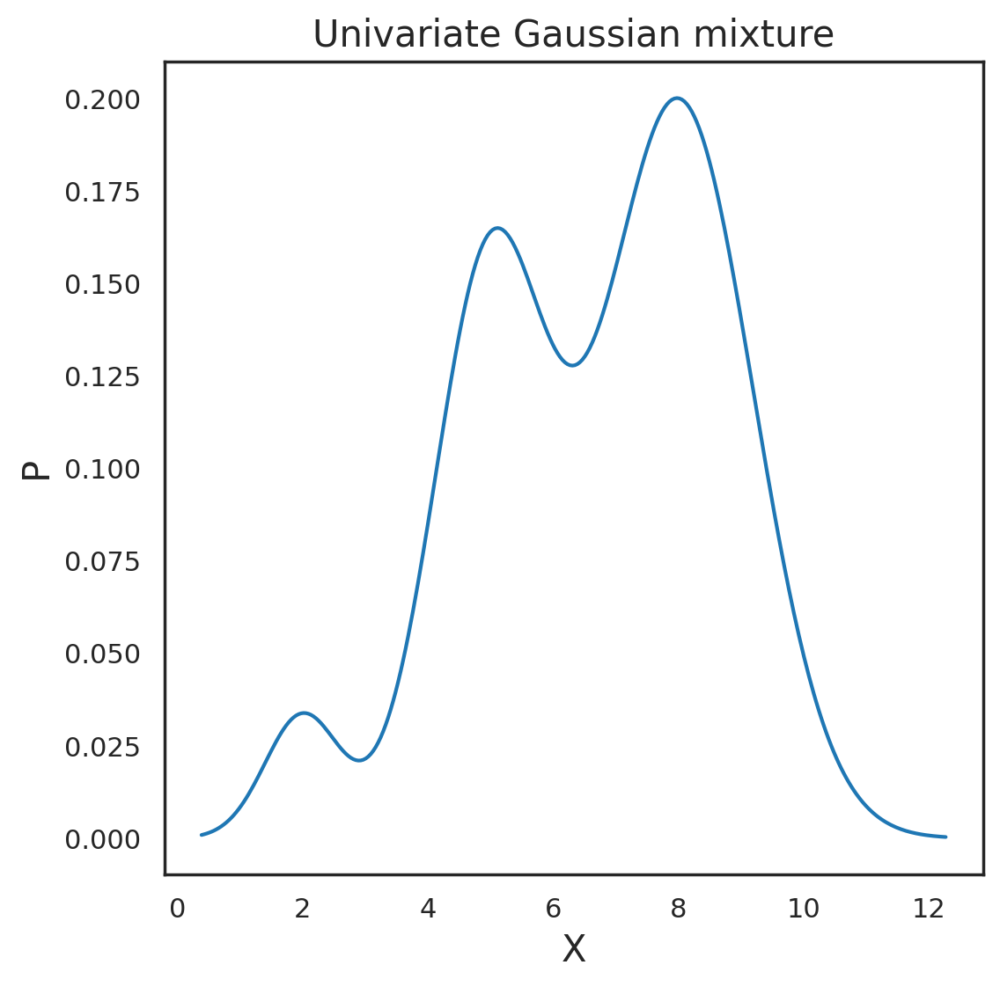

In [58]:
X3, fig3, ax3 = plot_univariate_mixture(means=[2,5,8], stds=[0.6, 0.9, 1.2], weights=[0.05, 0.35, 0.6])

When the weight of one Gaussian is reduced or increased, the likelihood of seeing a point from that Gaussian also decreases or increases, as illustrated in the distribution plot above.

Hence, in conclusion, the means determine the centers of the mixed Gaussians; the covariance matrices determine the width and shape of the mixed Gaussians; the weights determine the contributions of the Gaussians to the Gaussian mixture.

Introducing sklearn.mixture.GaussianMixture
With generated Gaussian mixture data, we know in advance the parameter values of the individual Gaussians. When we encounter a real-world dataset, how do we know the number of Gaussians to be included in the mixture model and their corresponding parameter values?

We can utilize the GaussianMixture class from Scikit-learn. This class allows us to estimate the parameters of a Gaussian mixture distribution.

A GaussianMixture.fit method is provided that learns a Gaussian Mixture Model from training data. Given test data, it can assign to each sample the Gaussian it mostly probably belong to using the GaussianMixture.predict method.

To solve for the parameters of GMM, the EM algorithm is implemented. E stands for Expectation and M stands for Maximization. The algorithm works by alternating between an E step, which calculates the expectation of the log-likelihood of observing the dataset using the current parameter estimates, and a M step, which seeks new parameters estimates that maximize the expectation found in the previous E step. This process is repeated until convergence.

For more detailed information on the EM algorithm, please see the page: EM-link

GMM.predict_proba
One parameter you must specify when implementing a GMM is n_components, which tells the algorithm how many clusters to look for in the dataset. Another parameter you should consider is covariance_type, which we will talk about later with a multivariate dataset.

Starting with X1, the univariate dataset we generated before using plot_univariate_mixture, we can fit a GMM to it with n_components = 3 and plot the predicted prior probabilities of each point belonging to the 3 clusters. GMM.predict_proba_ evaluates the components' density for each sample or for sample  𝑥𝑛
𝑥
𝑛
  the probability  𝑝(𝑖|𝑥𝑛)

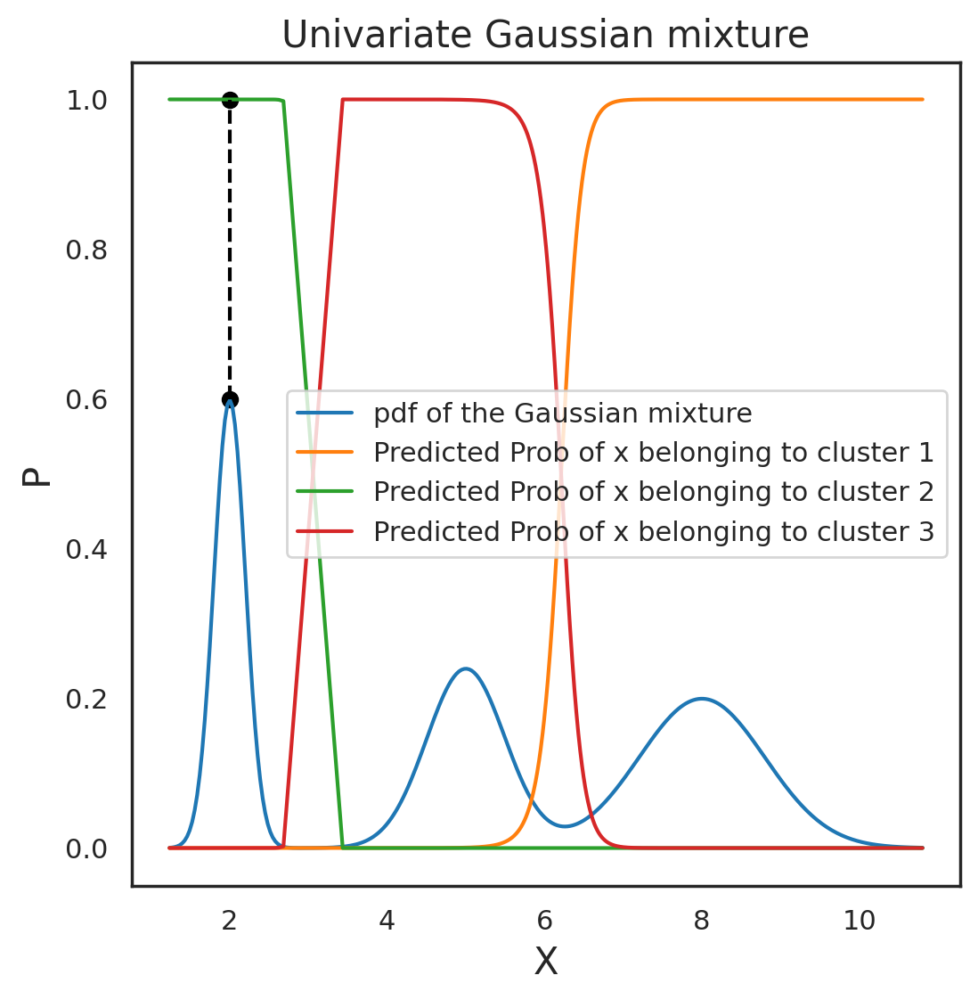

In [59]:
# sort X1 in ascending order for plotting purpose
X1_sorted = np.sort(X1.reshape(-1)).reshape(-1,1)

# fit the GMM
GMM = GaussianMixture(n_components=3, random_state=10)
GMM.fit(X1_sorted)

# store the predicted probabilities in prob_X1
prob_X1 = GMM.predict_proba(X1_sorted)

# start plotting!
ax1.plot(X1_sorted, prob_X1[:,0], label='Predicted Prob of x belonging to cluster 1')
ax1.plot(X1_sorted, prob_X1[:,1], label='Predicted Prob of x belonging to cluster 2')
ax1.plot(X1_sorted, prob_X1[:,2], label='Predicted Prob of x belonging to cluster 3')
ax1.scatter(2, 0.6, color='black')
ax1.scatter(2, 1.0, color='black')
ax1.plot([2, 2], [0.6, 1.0],'--', color='black')
ax1.legend()
fig1

To interpret the predicted probabilities, let's take a look at the point colored in black, as an example. On the Gaussian mixture pdf, the point is at the the peak of the first bell-shaped curve. Its corresponding probability of belonging to cluster 1 is equal to 1, which demonstrates that the probability of the center of a Gaussian distribution belonging to its own cluster is 100%.

Example 1: Applying GMM on a 2d dataset
Generate an artificial 2d Gaussian mixture data
We will use the helper function plot_bivariate_mixture to first generate a 2d Gaussian mixture dataset, and then visualize the data points.

In [63]:
!pip install scipy


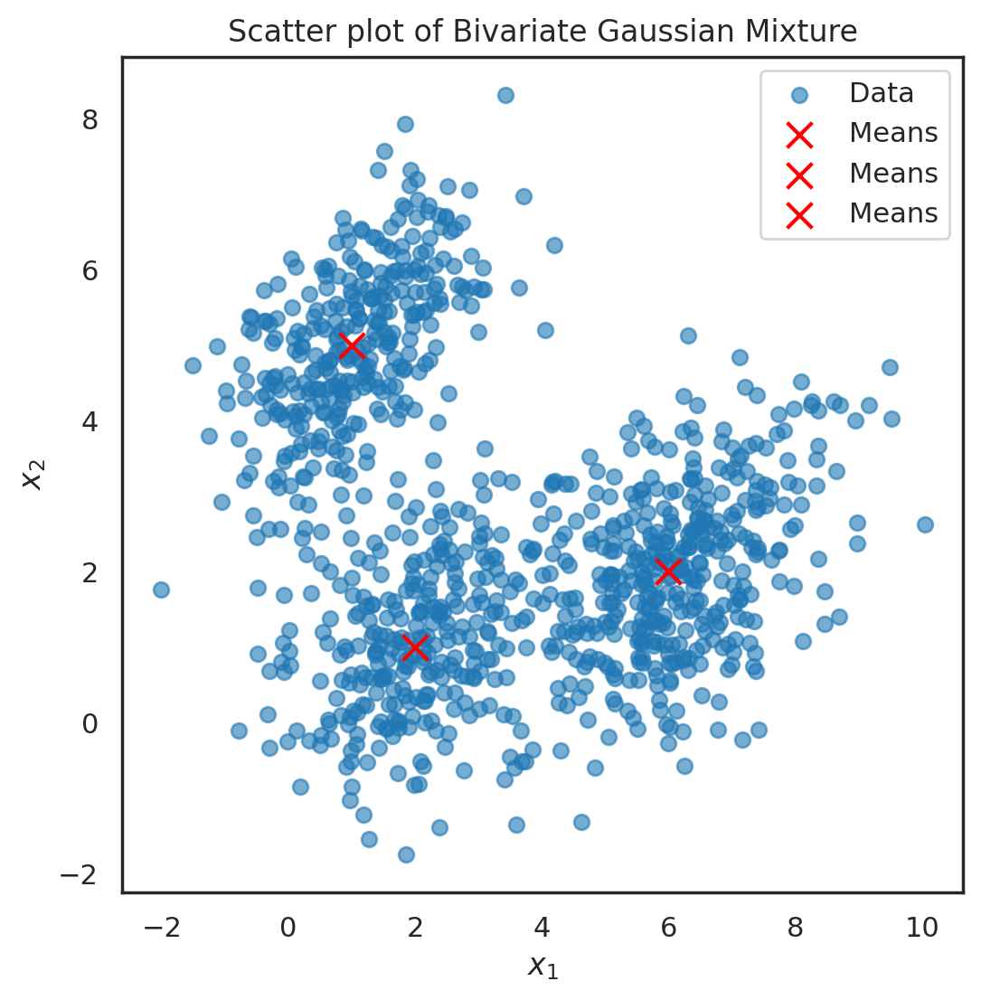

In [66]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import multivariate_normal

# Define function
def plot_bivariate_mixture(means, covs, weights, N=1000, seed=10):
    """
    Generates a 2D Gaussian mixture dataset and plots it as a scatter plot.
    """
    np.random.seed(seed)

    if not len(means) == len(covs) == len(weights):
        raise Exception("Length of means, covariances, and weights don't match.")

    K = len(means)
    M = len(means[0])

    mixture_idx = np.random.choice(K, size=N, replace=True, p=weights)

    # Generate N possible values of the mixture
    X = np.vstack([
        multivariate_normal.rvs(mean=means[i], cov=covs[i]) for i in mixture_idx
    ])

    # Scatter plot
    plt.scatter(X[:, 0], X[:, 1], label="Data", alpha=0.6)

    for pair in means:
        plt.scatter(pair[0], pair[1], color='red', marker='x', s=100, label="Means")

    plt.xlabel("$x_1$")
    plt.ylabel("$x_2$")
    plt.title("Scatter plot of Bivariate Gaussian Mixture")
    plt.legend()
    plt.show()

    return X

# Define parameters for Gaussian mixture model
means = [(1,5), (2,1), (6,2)]

# Fix covariance matrices to be positive semidefinite
cov1 = np.array([[1.0, 0.5], [0.5, 1.0]])  # Symmetric and positive semidefinite
cov2 = np.array([[1.2, 0.3], [0.3, 1.1]])  # Symmetric and positive semidefinite
cov3 = np.array([[1.5, 0.6], [0.6, 1.3]])  # Symmetric and positive semidefinite

covs = [cov1, cov2, cov3]
weights = [0.3, 0.3, 0.4]

# Run function
X4 = plot_bivariate_mixture(means=means, covs=covs, weights=weights, N=1000)


In [67]:
print("The dataset we generated has a shape of", X4.shape)

The dataset we generated has a shape of (1000, 2)


In [68]:
# since we generated a mixture dataset X4 with 3 Gaussians, it makes sense to set n_components = 3.
gm = GaussianMixture(n_components=3, random_state=0).fit(X4)
print("Means of the 3 Gaussians fitted by GMM are\n")
print(gm.means_)

Means of the 3 Gaussians fitted by GMM are

[[1.04177468 5.02286761]
 [6.09637536 1.989721  ]
 [2.02870126 1.11170535]]


In [69]:
print("Covariances of the 3 Gaussians fitted by GMM are")
gm.covariances_

Covariances of the 3 Gaussians fitted by GMM are


array([[[1.03504168, 0.63126262],
        [0.63126262, 1.1810498 ]],

       [[1.42937902, 0.58391802],
        [0.58391802, 1.29319351]],

       [[1.15970989, 0.34358638],
        [0.34358638, 1.08065575]]])

The 3 centers returned by our fitted GMM are all very close to the means we set for generating the mixture data, which means the model fitting was quite successful.

We can also draw the 3 ellipses, using the fitted parameter values, to check if they indeed represent the 3 clusters from our generated data.

Plot the clusters
We will use the helper functions draw_ellipse and plot_gmm to plot the original scatter plot as well as the clusters produced by a fitted GMM.

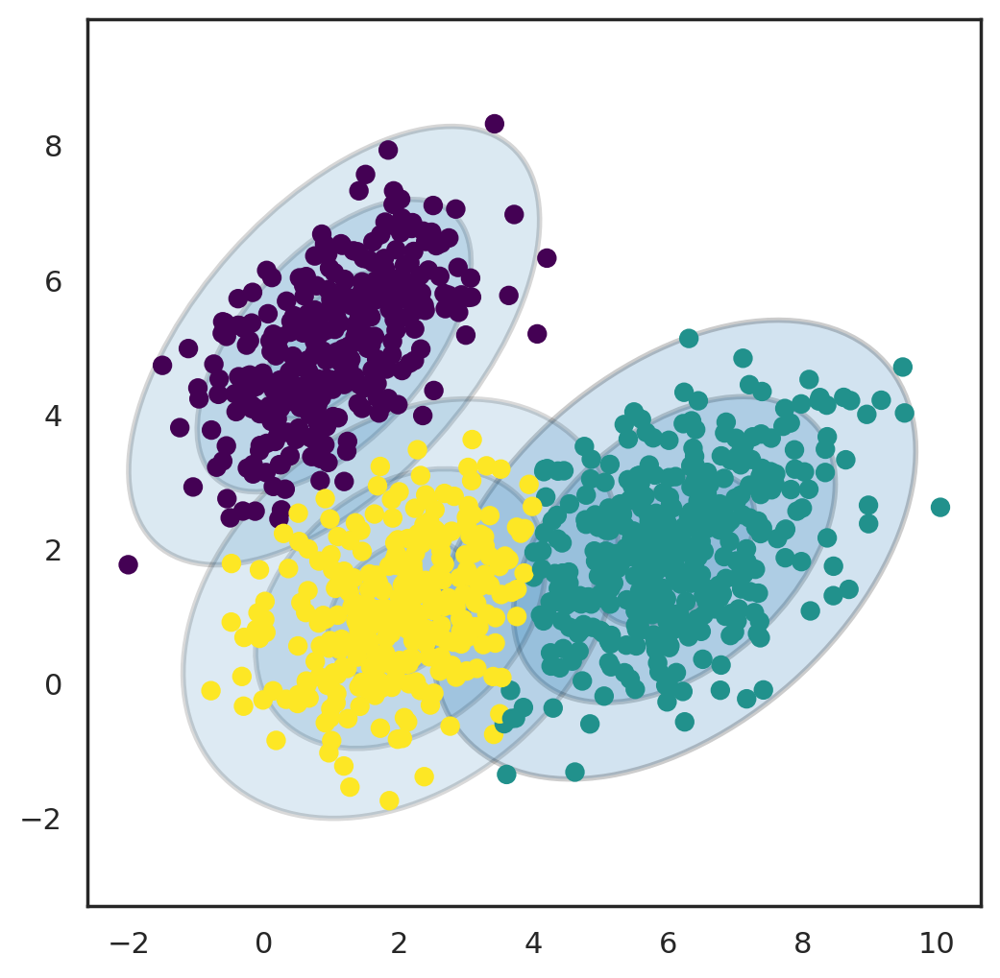

In [73]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.mixture import GaussianMixture
from matplotlib.patches import Ellipse

# Function to draw an ellipse (for visualization)
def draw_ellipse(position, covariance, ax=None, **kwargs):
    ax = ax or plt.gca()

    # Convert covariance to principal axes
    if covariance.shape == (2, 2):
        U, s, Vt = np.linalg.svd(covariance)
        angle = np.degrees(np.arctan2(U[1, 0], U[0, 0]))
        width, height = 2 * np.sqrt(s)
    else:
        angle = 0
        width, height = 2 * np.sqrt(covariance)

    # Draw the Ellipse (fixed argument issue)
    for nsig in range(1, 4):  # 1, 2, and 3 standard deviation ellipses
        ellipse = Ellipse(xy=position, width=nsig * width, height=nsig * height, angle=angle, **kwargs)
        ax.add_patch(ellipse)

# Function to plot Gaussian Mixture Model
def plot_gmm(gmm, X, label=True, ax=None):
    ax = ax or plt.gca()
    labels = gmm.fit(X).predict(X)

    if label:
        ax.scatter(X[:, 0], X[:, 1], c=labels, s=40, cmap='viridis', zorder=2)
    else:
        ax.scatter(X[:, 0], X[:, 1], s=40, zorder=2)

    ax.axis('equal')

    # Draw ellipses for each Gaussian component
    w_factor = 0.2 / gmm.weights_.max()
    for pos, covar, w in zip(gmm.means_, gmm.covariances_, gmm.weights_):
        draw_ellipse(pos, covar, ax, alpha=w * w_factor, edgecolor='black', linewidth=2)

# Create and plot GMM model
gmm = GaussianMixture(n_components=3, random_state=0)
plot_gmm(gmm, X4)
plt.show()


Try different values of Covariance_type
For the sklearn.mixture.GaussianMixture function, not only can we specify the number of clusters we want the GMM to fit, we can also specify the type of covariance parameters to use (recall we discussed that covariance matrices determine the shapes of our Gaussians. Depending on the dataset (different datasets have different Gaussian mixture structures), there are 4 values you can try for Covariance_type:

full each component has its own general covariance matrix.
tied all components share the same general covariance matrix.
diag each component has its own diagonal covariance matrix.
spherical each component has its own single variance.
The default Covariance_type in sklearn.mixture.GaussianMixture is full.

Sometimes you can't use covariance_type = full, because you can't invert it and this will give you an error.

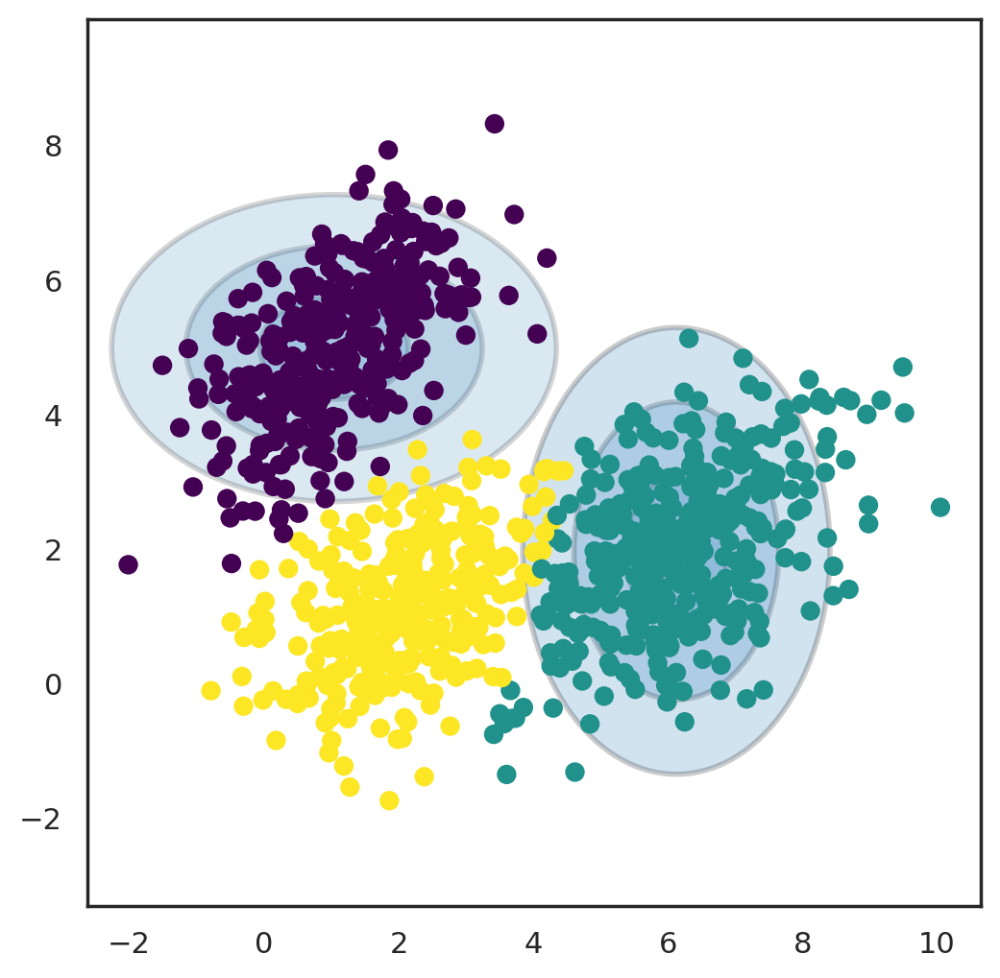

In [74]:
# try Covariance_type = 'tied'
plot_gmm(GaussianMixture(n_components=3, covariance_type='tied',random_state=0), # the model,
         X4)

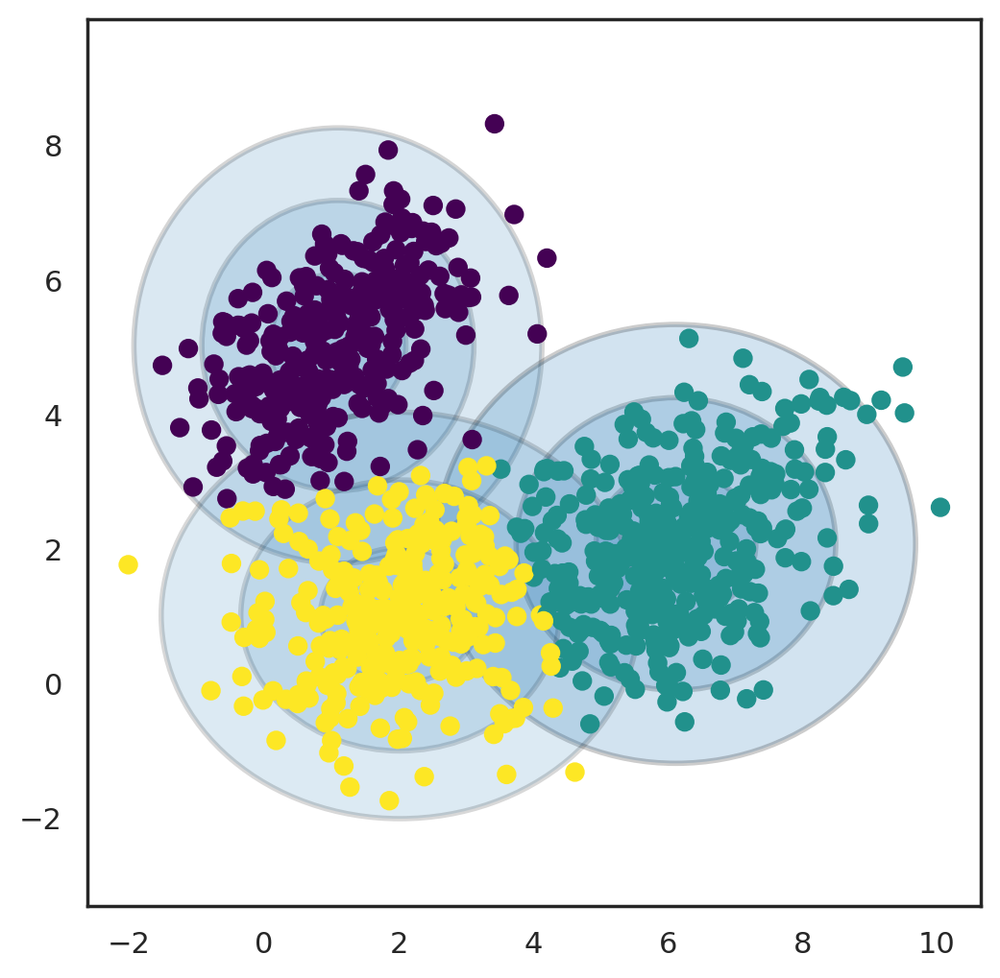

In [75]:
# try Covariance_type = 'diag'
plot_gmm(GaussianMixture(n_components=3, covariance_type='diag',random_state=0), # the model,
         X4)

It is clear visually that covariance_type = full is a good choice for the generated data. This makes sense because we did intentionally make each Gaussian have its own covariance matrix.

Now we know how to work with GMM in a lower dimension (2d), we can import a real-world dataset and use GMM to perform a clustering analysis on it.

Example 2: Applying GMM on real world data - Image Segmentation






Image segmentation is the process of segmenting an image into multiple important regions.

We can use a GMM to segment an image into K regions (n_components = K) according to significant colors.

Each pixel would be a data point with three features (r, g, b), or one feature, if greyscale.

For instance, if we are working with a 256  ×
×
  256 image, you would have 65536 pixels in total and your data  𝑋
𝑋
  would have a shape of 65536  ×
×
  3.

Let's look at an example using a picture of a house cat:

In [76]:
!wget -O gauss-cat.jpeg https://cf-courses-data.s3.us.cloud-object-storage.appdomain.cloud/IBM-ML0187EN-SkillsNetwork/labs/module%201/images/gauss-cat.jpeg


--2025-02-28 23:19:53--  https://cf-courses-data.s3.us.cloud-object-storage.appdomain.cloud/IBM-ML0187EN-SkillsNetwork/labs/module%201/images/gauss-cat.jpeg
Resolving cf-courses-data.s3.us.cloud-object-storage.appdomain.cloud (cf-courses-data.s3.us.cloud-object-storage.appdomain.cloud)... 198.23.119.245
Connecting to cf-courses-data.s3.us.cloud-object-storage.appdomain.cloud (cf-courses-data.s3.us.cloud-object-storage.appdomain.cloud)|198.23.119.245|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 983483 (960K) [image/jpeg]
Saving to: ‘gauss-cat.jpeg’

gauss-cat.jpeg      100%[===================>] 960.43K  4.14MB/s    in 0.2s    

2025-02-28 23:19:54 (4.14 MB/s) - ‘gauss-cat.jpeg’ saved [983483/983483]



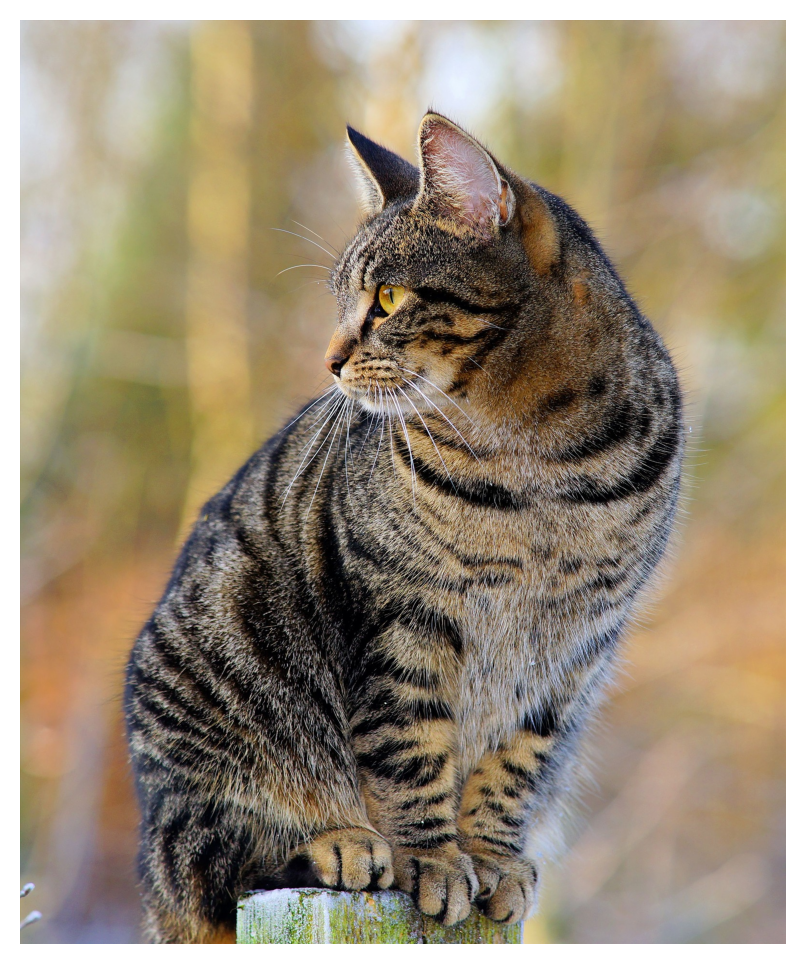

In [77]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

img = mpimg.imread("gauss-cat.jpeg")
plt.axis("off")
plt.imshow(img)
plt.show()


In [78]:
img = plt.imread('gauss-cat.jpeg')

# If img is greyscale, then change to .reshape(-1, 1):
X = img.reshape(-1, 3)
# The number of components; you can change this to a positive integer of your choice!:
n = 2
gmm = GaussianMixture(n_components=n, covariance_type='tied')
gmm.fit(X)
labels = gmm.predict(X) # num of pixels x 1

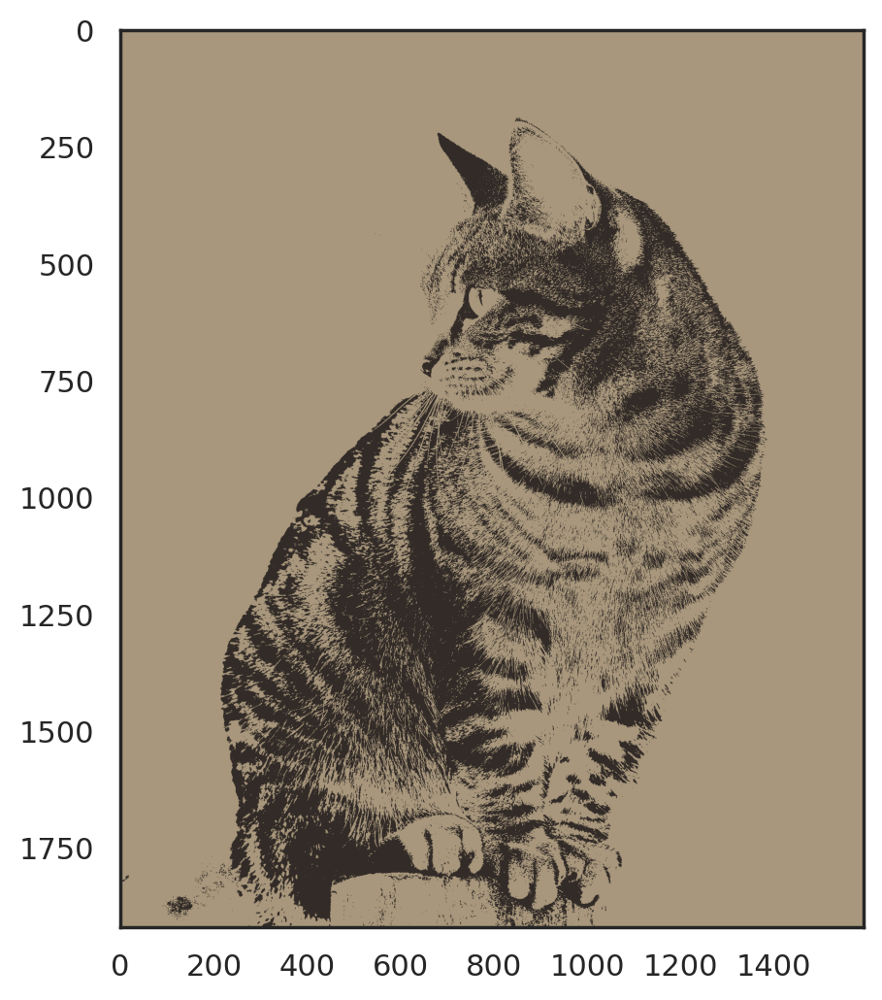

In [79]:
seg = np.zeros(X.shape) # num of pixels x 3

for label in range(n):
    seg[labels == label] = gmm.means_[label]
seg = seg.reshape(img.shape).astype(np.uint8)

plt.figure(figsize=(6,6))
plt.imshow(seg)

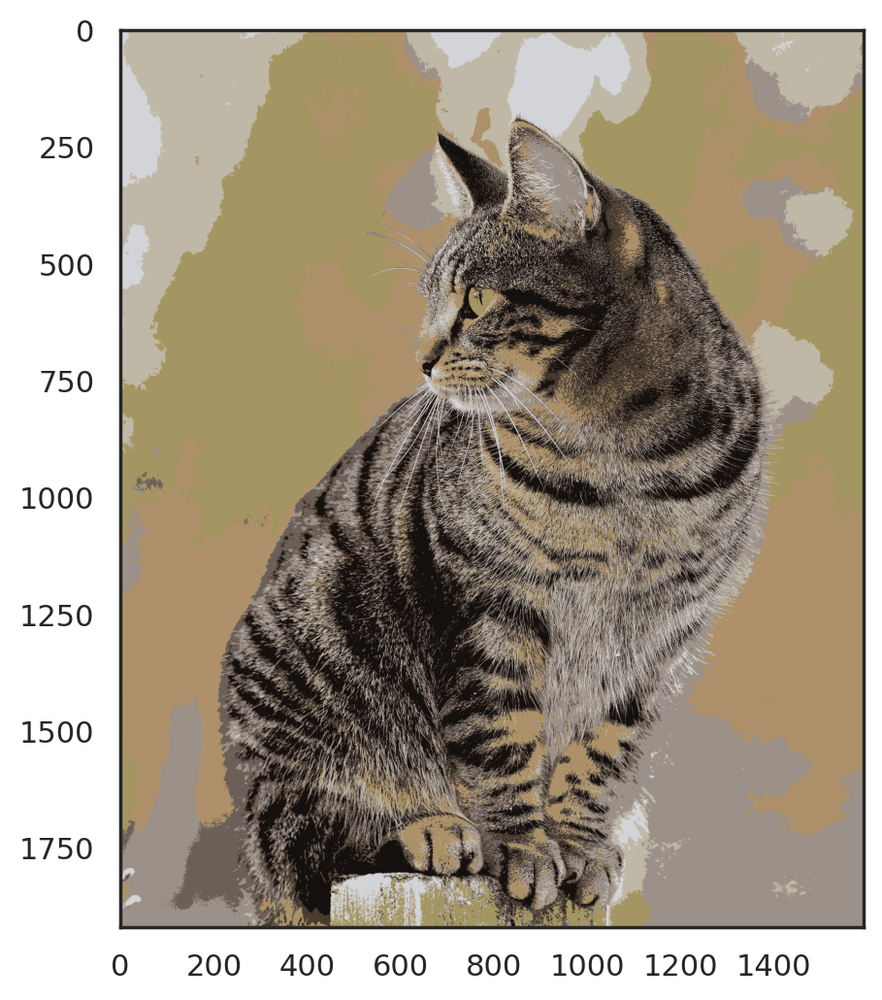

In [80]:
n = 8
gmm = GaussianMixture(n_components=n, covariance_type='tied')
gmm.fit(X)
labels = gmm.predict(X) # num of pixels x 1
seg = np.zeros(X.shape) # num of pixels x 3

for label in range(n):
    seg[labels == label] = gmm.means_[label]
seg = seg.reshape(img.shape).astype(np.uint8)
#cv2.imwrite(f'gauss-cat-{n}.jpeg', seg)

plt.figure(figsize=(6,6))
plt.imshow(seg)
plt.show()

In [81]:
!pip install opencv-python-headless  # Install OpenCV if not already installed


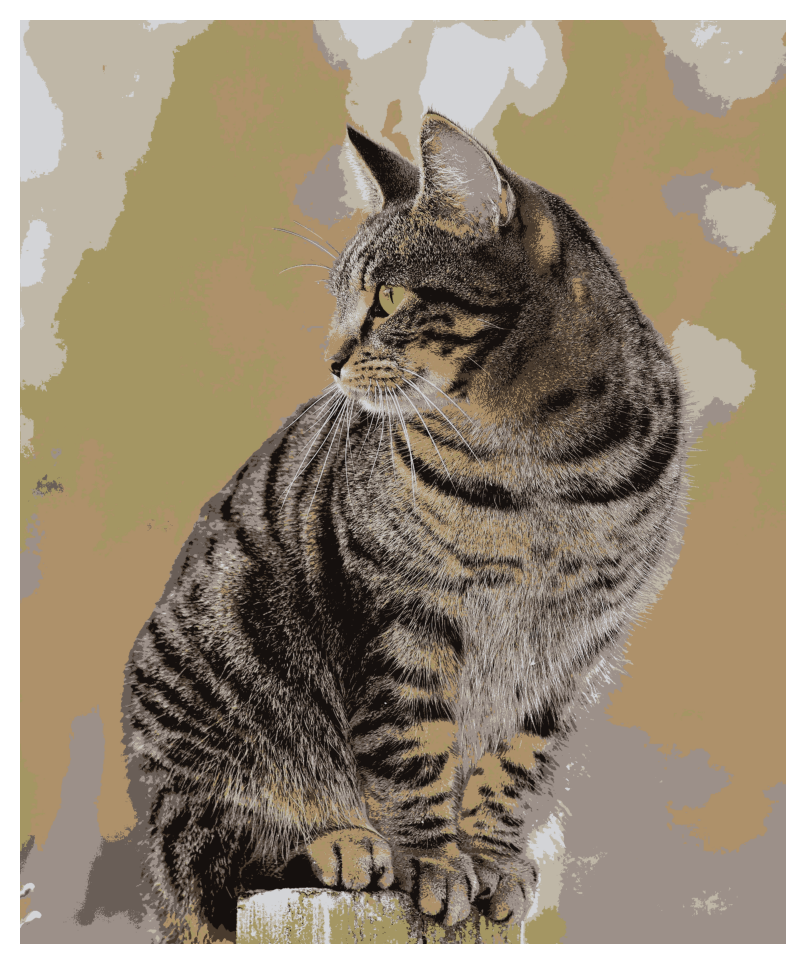

In [82]:
import numpy as np
import cv2  # For image processing
import matplotlib.pyplot as plt
from sklearn.mixture import GaussianMixture
import matplotlib.image as mpimg

# Load the image
img = mpimg.imread("gauss-cat.jpeg")

# Reshape image into (num_pixels, 3)
X = img.reshape(-1, 3)

# Define the number of clusters
n = 8

# Create and fit Gaussian Mixture Model
gmm = GaussianMixture(n_components=n, covariance_type='tied', random_state=42)
gmm.fit(X)

# Predict labels for each pixel
labels = gmm.predict(X)

# Create segmented image based on cluster means
seg = np.zeros(X.shape)  # Shape: (num_pixels, 3)
for label in range(n):
    seg[labels == label] = gmm.means_[label]

# Reshape back to original image shape
seg = seg.reshape(img.shape).astype(np.uint8)

# Save segmented image
cv2.imwrite(f'gauss-cat-{n}.jpeg', seg)

# Display the segmented image
plt.figure(figsize=(6,6))
plt.imshow(seg)
plt.axis("off")  # Hide axis
plt.show()


Our segmented image looks remarkably similar to the original, even though it uses only 8 colors!

Exercises
For the exercises, we will use the Customer Personality Analysis dataset (marketing_campaign.csv) from Kaggle, provided by Dr. Omar Romero-Hernandez. Several preprocessing steps were taken, including but not limited to, impute missing values, feature engineering, and feature encoding.

The preprocessed customers dataset contains 19 attributes on the customers' purchasing behaviors, education, income, marital status, etc. You will be able to practice principal component analysis, and apply GMM on the dataset for the purpose of customer segmentation.

First we load data into a pandas.DataFrame:

In [83]:
data = pd.read_csv("https://cf-courses-data.s3.us.cloud-object-storage.appdomain.cloud/IBM-ML0187EN-SkillsNetwork/labs/module%201/customers.csv")
data.head()

# you can also download the csv file to your local workspace using:
# ! wget https://cf-courses-data.s3.us.cloud-object-storage.appdomain.cloud/IBM-ML0187EN-SkillsNetwork/labs/module%201/customers.csv

,Education,Income,Kidhome,Teenhome,Recency,Wines,Fruits,Meat,Fish,Sweets,Gold,NumDealsPurchases,NumWebPurchases,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,Spent,Living_Status,Children
0,0,58138.0,0,0,58,635,88,546,172,88,88,3,8,10,4,7,1617,0,0
1,0,46344.0,1,1,38,11,1,6,2,1,6,2,1,1,2,5,27,0,2
2,0,71613.0,0,0,26,426,49,127,111,21,42,1,8,2,10,4,776,1,0
3,0,26646.0,1,0,26,11,4,20,10,3,5,2,2,0,4,6,53,1,1
4,1,58293.0,1,0,94,173,43,118,46,27,15,5,5,3,6,5,422,1,1


In [84]:
data.shape

(2216, 19)

Exercise 1 - Scale the data (using StandardScaler)

In [86]:
from sklearn.preprocessing import StandardScaler

# Initialize the StandardScaler
SS = StandardScaler()

# Fit and transform the data (X should be a 2D array)
X_scaled = SS.fit_transform(X)


In [87]:
X = img.reshape(-1, 3)  # Reshape image into (num_pixels, 3)
X_scaled = SS.fit_transform(X)  # Normalize pixel values


Exercise 2 - Use PCA with n_components = 2 for dimension reduction

In [89]:
from sklearn.decomposition import PCA

# Initialize PCA with 2 components
pca2 = PCA(n_components=2)

# Fit PCA and transform X_scaled
reduced_2_PCA = pca2.fit_transform(X_scaled)


In [90]:
X = img.reshape(-1, 3)  # Flatten image into (num_pixels, 3)
X_scaled = StandardScaler().fit_transform(X)  # Normalize pixel values

pca2 = PCA(n_components=2)
reduced_2_PCA = pca2.fit_transform(X_scaled)

print(reduced_2_PCA.shape)  # Should be (num_pixels, 2)


(3054720, 2)


In [91]:
model = GaussianMixture(n_components=4, random_state=0)
model.fit(reduced_2_PCA)

GaussianMixture(n_components=4, random_state=0)

In [92]:
PCA_2_pred = model.predict(reduced_2_PCA)

Text(0, 0.5, 'PCA 2')

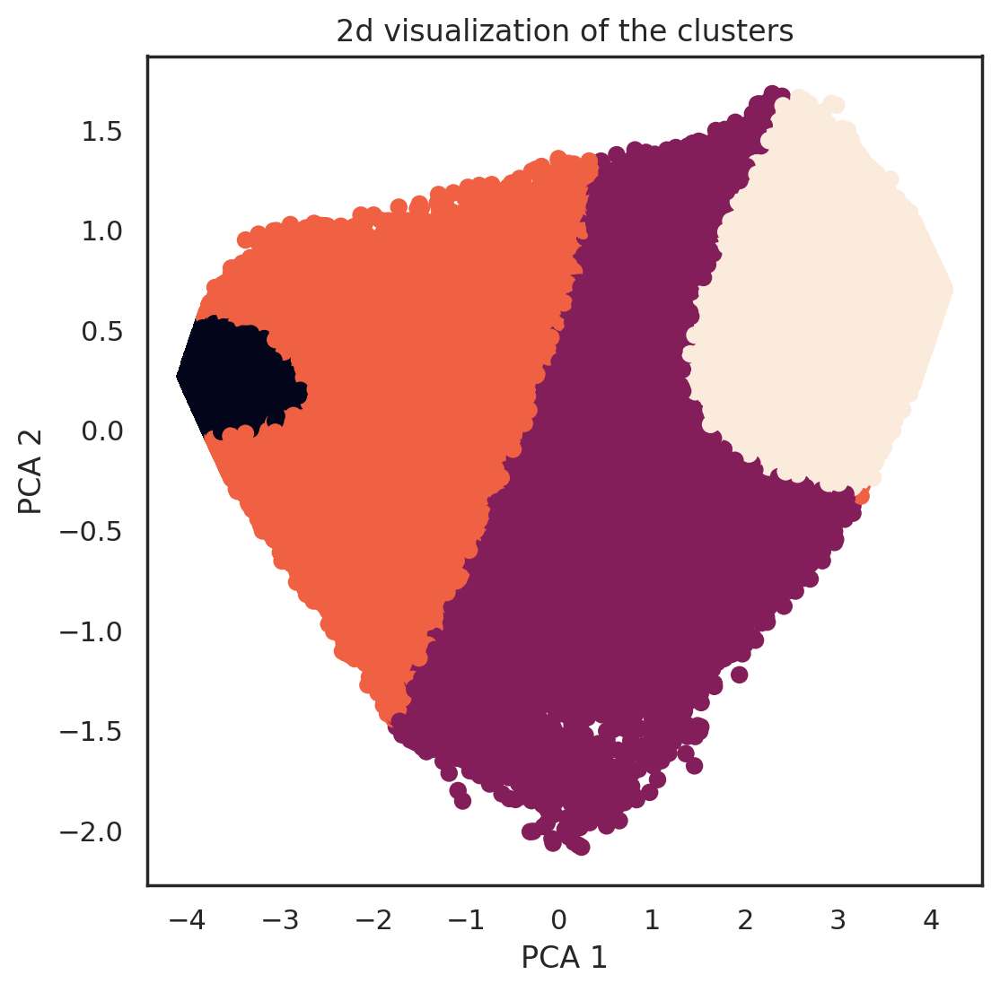

In [93]:
x = reduced_2_PCA[:,0]
y = reduced_2_PCA[:,1]
plt.scatter(x, y, c=PCA_2_pred)
plt.title("2d visualization of the clusters")
plt.xlabel("PCA 1")
plt.ylabel("PCA 2")

Text(0.5, 0.92, '3D projection of the clusters')

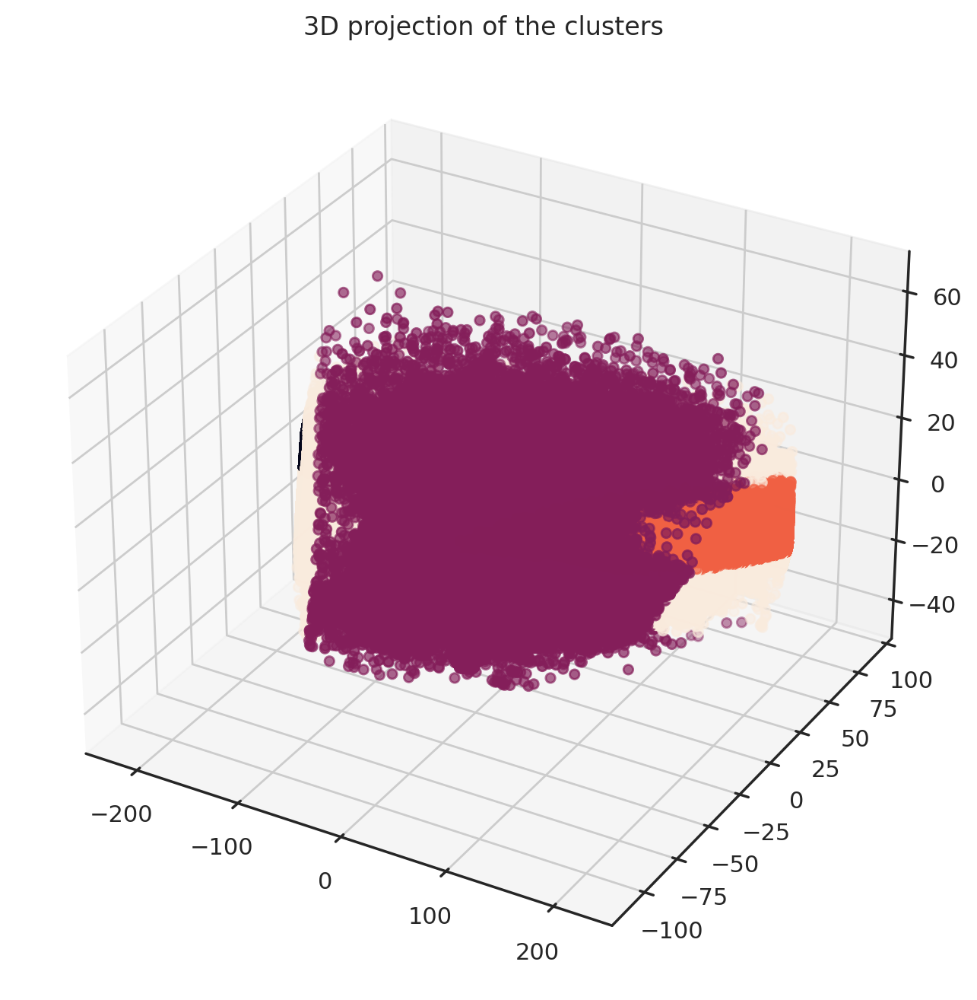

In [96]:
# PCA with n=3 and clustering
pca3 = PCA(n_components=3)
reduced_3_PCA = pca3.fit(X).transform(X)
mod = GaussianMixture(n_components=4, random_state=0)
PCA_3_pred = mod.fit(reduced_3_PCA).predict(reduced_3_PCA)

# plotting
reduced_3_PCA = pd.DataFrame(reduced_3_PCA, columns=(['PCA 1', 'PCA 2', 'PCA 3']))
fig = plt.figure(figsize=(10,8))
ax = fig.add_subplot(111, projection="3d")
ax.scatter(reduced_3_PCA['PCA 1'],reduced_3_PCA['PCA 2'],reduced_3_PCA['PCA 3'], c=PCA_3_pred)
ax.set_title("3D projection of the clusters")